# Library management

In [1]:
!pip3 install ipdb
!pip3 install tqdm
!pip3 install torchlars

     |████████████████████████████████| 788kB 39.9MB/s 
     |████████████████████████████████| 368kB 44.6MB/s 
  Created wheel for ipdb: filename=ipdb-0.13.8-cp37-none-any.whl size=11599 sha256=2bc328269d1071cc4cf4901ffff5efe44495348f5ba5d6a56c3977930d728dc0
  Stored in directory: /root/.cache/pip/wheels/0d/d6/5a/2fdf30b75ca5099e18f66a0a4d439ba031e1aa239e12b39c24
Successfully built ipdb
ERROR: jupyter-console 5.2.0 has requirement prompt-toolkit<2.0.0,>=1.0.0, but you'll have prompt-toolkit 3.0.18 which is incompatible.
ERROR: google-colab 1.0.0 has requirement ipython~=5.5.0, but you'll have ipython 7.24.0 which is incompatible.
  Found existing installation: prompt-toolkit 1.0.18
    Uninstalling prompt-toolkit-1.0.18:
      Successfully uninstalled prompt-toolkit-1.0.18
  Found existing installation: ipython 5.5.0
    Uninstalling ipython-5.5.0:
      Successfully uninstalled ipython-5.5.0


  Created wheel for torchlars: filename=torchlars-0.1.2-cp37-cp37m-linux_x86_64.whl size=1953650 sha256=b82b883eedabab2ea5da275f78da13e6bab68466422d51547ec9d9d7b08dcdf8
  Stored in directory: /root/.cache/pip/wheels/0e/a8/99/9647d66c1734f1f78ffb0e303273e1a301ecc8d0cb10473646
Successfully built torchlars


In [2]:
import ipdb
from PIL import Image
# from __future__ import print_function, division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import pandas as pd
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy
import pdb
from tqdm import tqdm
from pathlib import Path
from torch.utils.data import DataLoader, SubsetRandomSampler
import pandas as pd
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from skimage import io as skio
import itertools
from scipy.spatial.distance import cdist
from torchlars import LARS

from torch.cuda.amp import GradScaler, autocast
import torch.nn.functional as F

import seaborn as sns

import argparse
import cv2
from torch.autograd import Function

plt.ion()   # interactive mode
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
seed = 42

# **_Images preparation and transformations_**

## **Load data and define transformation**

In [3]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [4]:
config_dir = "2"
batch_dir = "1"

root_path = Path('gdrive/My Drive/SKRIPSI/embryo')
path_combine = Path('gdrive/My Drive/SKRIPSI/embryo_comb')
path_rotation = Path('gdrive/My Drive/SKRIPSI/embryo_rot')
path_jigsaw = Path('gdrive/My Drive/SKRIPSI/embryo_jigsaw')
root_path_nolab = Path('/content/gdrive/My Drive/SKRIPSI/embryo_no_label/images')

str_path_grad = 'gdrive/My Drive/SKRIPSI/grad_cam/config'+config_dir+'/batch'+batch_dir
path_grad_cam = Path(str_path_grad)

str_path_models = 'gdrive/My Drive/SKRIPSI/config'+config_dir+'/batch'+batch_dir+'/models'
path_models = Path(str_path_models)
print(path_models)

str_result = 'gdrive/My Drive/SKRIPSI/config'+config_dir+'/batch'+batch_dir+'/results'
path_result = Path(str_result)

gdrive/My Drive/SKRIPSI/config2/batch1/models


### Image Transformation

>#### Images transformations for nopretext, jigsaw and rotation

In [5]:
gen_rotation_transformation = transforms.Compose([transforms.ToPILImage(),
                                                  transforms.Resize((224,224)),
                                                  ])
rotation_transformation = transforms.Compose([transforms.ToTensor(),
                                              transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])
                                             ])

gen_jigsaw_transformation = transforms.Compose([transforms.ToPILImage(),
                                               transforms.Resize((225,225)),
                                               transforms.ToTensor()
                                               ])
jigsaw_transformation = transforms.Compose([
                                            transforms.ToTensor(),
                                            transforms.Normalize([0.485, 0.456, 0.406],
                                                                 [0.229, 0.224, 0.225])
                                           ])

data_transforms = transforms.Compose([transforms.Resize((224,224)),
                                      transforms.ToTensor(), 
                                      transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])
                                      ])

>#### SimCLRv1 images preprocessing

In [6]:
def get_simclr_pipeline_transform(size, s=1, mode='train'):
  if mode == 'train':
    """Return a set of data augmentation transformations as described in the SimCLR paper."""
    color_jitter = transforms.ColorJitter(0.4 * s, 0.4 * s, 0.4 * s, 0.1 * s)
    data_transforms = transforms.Compose([transforms.RandomResizedCrop(size=size),
                                          transforms.RandomHorizontalFlip(p=0.5),
                                          transforms.RandomApply([color_jitter], p=0.8),
                                          transforms.RandomGrayscale(p=0.2),
                                          transforms.GaussianBlur(kernel_size=int(1)),
                                          transforms.ToTensor(),
                                          transforms.Normalize([0.485, 0.456, 0.406],
                                                               [0.229, 0.224, 0.225])
                                          ])
  else:
    data_transforms = transforms.Compose([transforms.Resize((224,224)),
                                          transforms.ToTensor(),
                                          transforms.Normalize([0.485, 0.456, 0.406],
                                                               [0.229, 0.224, 0.225])
                                         ])
  return data_transforms

In [7]:
class ContrastiveLearningViewGenerator(object):
    """Take two random crops of one image as the query and key."""
    def __init__(self, base_transform, n_views=2):
        self.base_transform = base_transform
        self.n_views = n_views

    def __call__(self, x):
        return [self.base_transform(x) for i in range(self.n_views)]

### f(x) to display image

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# def imshow_simclr(inp, title=None):
#     """Imshow for Tensor."""
#     inp = inp.numpy().transpose((1, 2, 0))
#     plt.imshow(inp)
#     if title is not None:
#         plt.title(title)
#     plt.pause(0.001)  # pause a bit so that plots are updated

## **No pretext data prep**
_*only for Downstream task_

> ### Train Data

In [9]:
training_image_datasets = datasets.ImageFolder(Path(path_combine),data_transforms)

In [10]:
downstram_cls_len = len(training_image_datasets.class_to_idx)
training_image_datasets.class_to_idx

{'Grade 1': 0, 'Grade 2': 1, 'Grade 3': 2}

In [11]:
train_set, val_set = train_test_split(training_image_datasets, test_size=0.3, random_state=seed)

In [12]:
training_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'val': DataLoader(val_set, batch_size=16, shuffle=False)
}

In [13]:
len(training_dataloader['train'].dataset),len(training_dataloader['val'].dataset)

(858, 368)

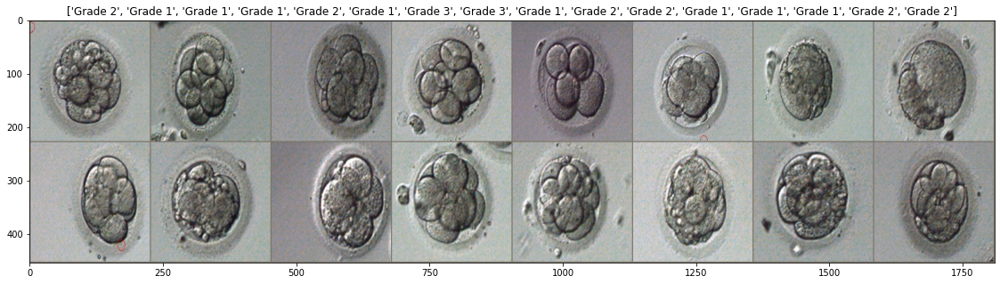

In [14]:
# Get a batch of training data
inputs, classes = next(iter(training_dataloader['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[training_image_datasets.classes[x] for x in classes])

> ### Test data

In [15]:
test_image_datasets = {x: datasets.ImageFolder(Path(root_path)/x,
                                                     data_transforms)
                            for x in ['train', 'test']}

In [16]:
test_dataloader = {x: torch.utils.data.DataLoader(test_image_datasets[x], 
                                                        batch_size=16,
                                                        shuffle=False, 
                                                        num_workers=1) 
                        for x in ['train', 'test']}

dataset_sizes_test = {x: len(test_image_datasets[x]) for x in ['train', 'test']}
dataset_sizes_test

{'test': 307, 'train': 919}

In [17]:
test_dataloader['test'].dataset.class_to_idx

{'Grade 1': 0, 'Grade 2': 1, 'Grade 3': 2}

In [18]:
len(test_dataloader['train'].dataset),len(test_dataloader['test'].dataset)

(919, 307)

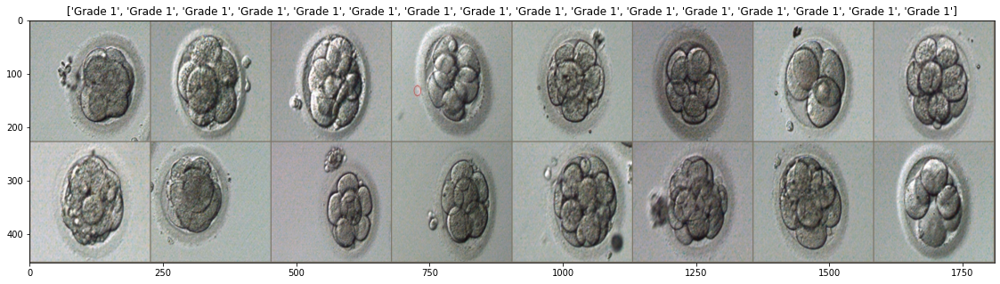

In [19]:
# Get a batch of training data
inputs, classes = next(iter(test_dataloader['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[test_dataloader['train'].dataset.classes[x] for x in classes])

## __SimCLRv1 data prep__

> ### Train data

In [ ]:
training_simclr_datasets = datasets.ImageFolder(Path(path_combine),
                                                ContrastiveLearningViewGenerator(
                                                    get_simclr_pipeline_transform(100),2)
                                                )

In [ ]:
training_simclr_datasets.class_to_idx

{'Grade 1': 0, 'Grade 2': 1, 'Grade 3': 2}

In [ ]:
train_set, val_set = train_test_split(training_simclr_datasets, test_size=0.3, random_state=seed)

In [ ]:
training_simclr_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'val': DataLoader(val_set, batch_size=16, shuffle=False)
}

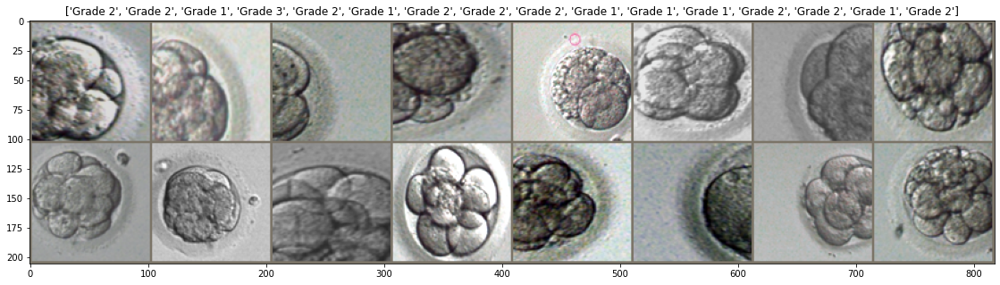

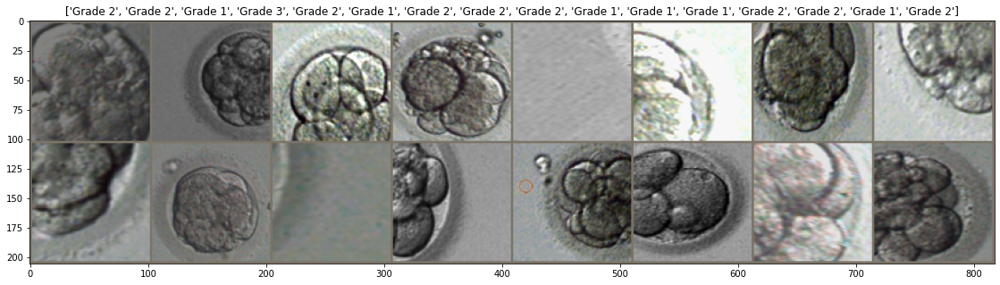

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(training_simclr_dataloader['train']))

# # Make a grid from batch
out1 = torchvision.utils.make_grid(inputs[0])
out2 = torchvision.utils.make_grid(inputs[1])
plt.figure(figsize=(20,5))
imshow(out1, title=[training_simclr_datasets.classes[x] for x in classes])
plt.figure(figsize=(20,5))
imshow(out2, title=[training_simclr_datasets.classes[x] for x in classes])

> ### Test data

In [ ]:
test_simclr_datasets = {x: datasets.ImageFolder(Path(root_path)/x,
                                                     ContrastiveLearningViewGenerator(
                                                         get_simclr_pipeline_transform(100,
                                                                                       mode='test'),
                                                                                      2)
                                                     )
                            for x in ['train', 'test']}

In [ ]:
test_simclr_dataloader = {x: torch.utils.data.DataLoader(test_simclr_datasets[x], 
                                                        batch_size=16,
                                                        shuffle=False, 
                                                        num_workers=1) 
                        for x in ['train', 'test']}

In [ ]:
len_class_simclr = len(test_simclr_dataloader['test'].dataset.class_to_idx)

In [ ]:
len(test_simclr_dataloader['train'].dataset),len(test_simclr_dataloader['test'].dataset)

(919, 307)

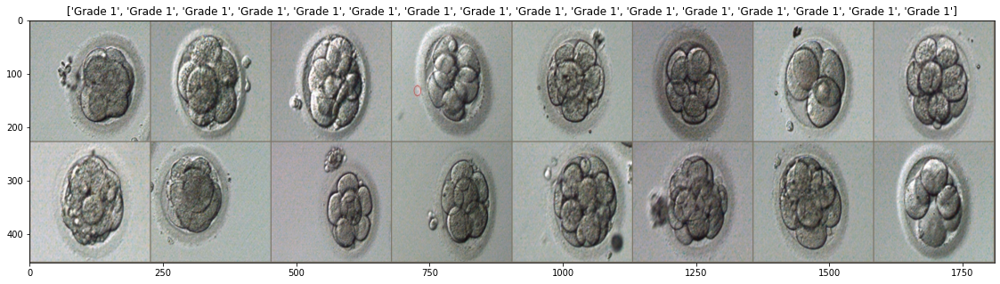

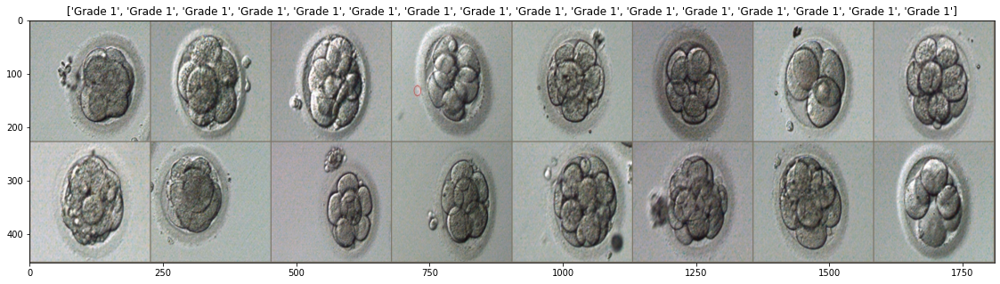

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(test_simclr_dataloader['train']))

# # Make a grid from batch
out1 = torchvision.utils.make_grid(inputs[0])
out2 = torchvision.utils.make_grid(inputs[1])
plt.figure(figsize=(20,5))
imshow(out1, title=[test_simclr_datasets['train'].classes[x] for x in classes])
plt.figure(figsize=(20,5))
imshow(out2, title=[test_simclr_datasets['train'].classes[x] for x in classes])

## **Rotation data prep**

> ### Generate rotated images
_*(run only if Rotated Images unavailable)_

In [ ]:
def rand_img_rotation(origin_path, destination_path, transform = gen_rotation_transformation):
  np.random.seed(seed)
  rot_deg = [0,90,180,270]

  ## rotate test images
  for image in tqdm(os.listdir(origin_path), desc='rotating image'):
    img = skio.imread(origin_path/image)
    img = transform(img)
    # degree = rot_deg[np.random.randint(0,len(rot_deg))]

    for degree in rot_deg:
      img_temp = img.rotate(degree)
      try:
        img_temp = img_temp.save(destination_path/str(degree)/image)
      except:
        os.mkdir(destination_path/str(degree))
        img_temp = img_temp.save(destination_path/str(degree)/image)

In [ ]:
rand_img_rotation(root_path_nolab,path_rotation)

rotating image: 100%|██████████| 1226/1226 [05:34<00:00,  3.66it/s]


> ### Train Data

In [ ]:
training_rotation_datasets = datasets.ImageFolder(Path(path_rotation),rotation_transformation)
len_class_rotation = len(training_rotation_datasets.class_to_idx)
training_rotation_datasets.class_to_idx


{'0': 0, '180': 1, '270': 2, '90': 3}

In [ ]:
train_set, val_set = train_test_split(training_rotation_datasets, test_size=0.3, random_state=seed)

training_rotation_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'val': DataLoader(val_set, batch_size=16, shuffle=False)
}

In [ ]:
len(training_rotation_dataloader['train'].dataset),len(training_rotation_dataloader['val'].dataset)

(3432, 1472)

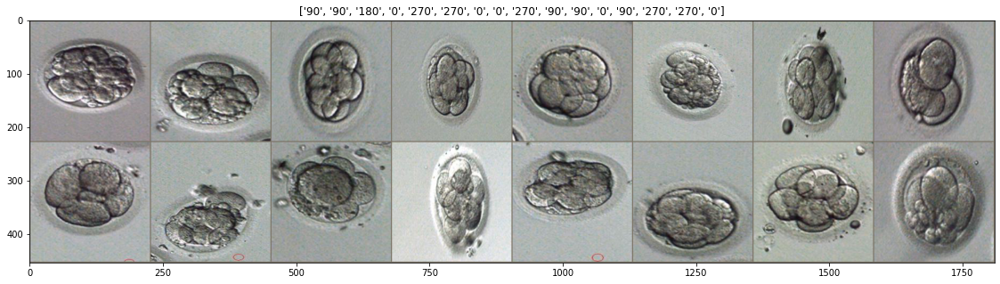

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(training_rotation_dataloader['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[training_rotation_datasets.classes[x] for x in classes])

> ### Test Data

In [ ]:
test_rotation_datasets = datasets.ImageFolder(Path(path_rotation),rotation_transformation)
test_rotation_datasets.class_to_idx

{'0': 0, '180': 1, '270': 2, '90': 3}

In [ ]:
train_set, val_set = train_test_split(test_rotation_datasets, test_size=0.25, random_state=seed)

test_rotation_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'test': DataLoader(val_set, batch_size=16, shuffle=False)
}

In [ ]:
len(test_rotation_dataloader['train'].dataset),len(test_rotation_dataloader['test'].dataset)

(3678, 1226)

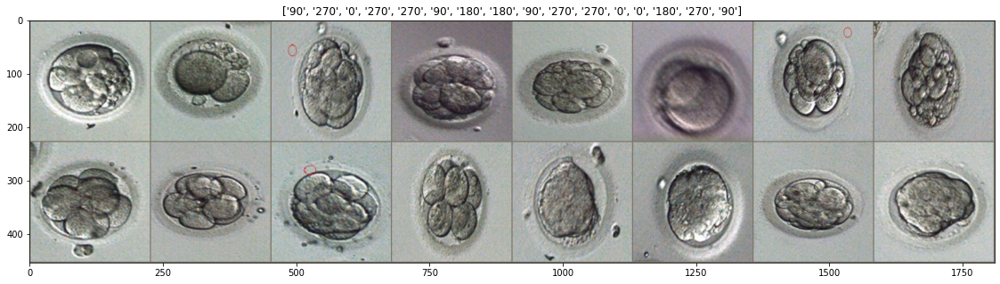

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(test_rotation_dataloader['test']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[test_rotation_datasets.classes[x] for x in classes])

## **Jigsaw data prep**

>### Define Hamming Distance
_*(run only if scrambled Jigsaw Images unavailable)_

In [ ]:
num_crops = 9
P_hat = np.array(list(itertools.permutations(list(range(num_crops)), num_crops)))
P_hat = np.delete(P_hat, 0, axis=0) # make sure original order of tile not chosen twice
n = len(P_hat)

num_permutations = 30
for i in range(num_permutations): #0-9
  if i == 0:
    j = np.random.randint(n)
    P = np.array(P_hat[j]).reshape([1, -1])
  else:
    P = np.concatenate([P, P_hat[j].reshape([1, -1])], axis=0)

  P_hat = np.delete(P_hat, j, axis=0)
  D = cdist(P, P_hat, metric='hamming').mean(axis=0).flatten()
  
  j = D.argmax()

In [ ]:
permutation_arr = P

>### Scramble images
_*(run only if scrambled Jigsaw Images unavailable)_

In [ ]:
# split image into 74x74 tile
from PIL import Image
def split_tile(image):
  to_pil = transforms.ToPILImage()
  to_tensor = transforms.ToTensor()
  random_crop = transforms.RandomCrop(64)

  tiles=list()
  idx=0
  a=0
  b=75
  for i in range(3):
    c=0
    d=75
    for j in range(3):
      tile = image[:, a:b, c:d]
      tile=to_pil(tile)
      # tile=to_tensor(tile)
      tile=random_crop(tile)
      # tile=to_pil(tile)
      tiles.append(tile)
      c+=75
      d+=75
      idx+=1
    a+=75
    b+=75
  return tiles

def tile_scramble(scrambled_img, placement):  
  idx=0
  a=0
  b=64
  for i in range(3):
    c=0
    d=64
    for j in range(3):
      scrambled_img[:, a:b, c:d] = placement[idx]
      c+=64
      d+=64
      idx+=1
    a+=64
    b+=64
  # scrambled_img=to_pil(scrambled_img)
  scrambled_img=scrambled_img[:,:192,:192]
  # plt.imshow(scrambled_img.permute(1,2,0))
  return scrambled_img

In [ ]:
def gen_scrambled_img(path, crop_val=149):
  images_generated = 0
  to_pil = transforms.ToPILImage()
  to_tensor = transforms.ToTensor()
  resize_aftercrop = transforms.Resize((192,192))

  idx_batch = 0

  for image in tqdm(os.listdir(path), desc='generating scrambled images'):
    img = skio.imread(path/image)
    img = gen_jigsaw_transformation(img)

    tiles = split_tile(img)

    # ## Multiple random permutation ##
    # temp_idx_ls = list()
    # for generate_permut in range(5):
    #   rand_idx = np.random.randint(len(permutation_arr))
    #   if len(temp_idx_ls) == 0:
    #     permutations_list = np.array(permutation_arr[rand_idx]).reshape([1, -1])
    #     temp_idx_ls.append(rand_idx)
    #   else:
    #     while (rand_idx in temp_idx_ls):
    #       rand_idx = np.random.randint(len(permutation_arr))
    #     temp = np.array(permutation_arr[rand_idx]).reshape([1, -1])
    #     permutations_list = np.append(permutations_list, temp, axis=0)
    #     temp_idx_ls.append(rand_idx)

    ## One random permutation ##
    rand_idx = np.random.randint(len(permutation_arr))
    permutations_list = np.array(permutation_arr[rand_idx]).reshape([1, -1])
    
    permutations_list = np.append(permutations_list, [[0,1,2,3,4,5,6,7,8]], axis=0)

    for permutation in permutations_list:
      placement=list()
      scrambled_img = img   # reset image state

      for order in permutation:
        placement.append(tiles[order])
      for i in range(len(placement)):
        placement[i] = to_tensor(placement[i])

      scrambled_img = tile_scramble(scrambled_img, placement)
      scrambled_img = resize_aftercrop(scrambled_img)
      scrambled_img = to_pil(scrambled_img)
      
      images_generated+=1
      folder_name = "".join(map(str, permutation))
      try:
        scrambled_img = scrambled_img.save(path_jigsaw/folder_name/str(image[:-4]+'__'+folder_name+'.jpg'))
      except:
        os.mkdir(path_jigsaw/folder_name)
        scrambled_img = scrambled_img.save(path_jigsaw/folder_name/str(image[:-4]+'__'+folder_name+'.jpg'))

  print(images_generated,'images generated')

In [ ]:
gen_scrambled_img(root_path_nolab)

generating scrambled images: 100%|██████████| 1226/1226 [05:03<00:00,  4.05it/s]

2452 images generated


>### Training Data

In [ ]:
training_jigsaw_datasets = datasets.ImageFolder(Path(path_jigsaw), jigsaw_transformation)
len_class_jigsaw = len(training_jigsaw_datasets.class_to_idx)
training_jigsaw_datasets.class_to_idx


{'012345678': 0,
 '012376584': 1,
 '013254768': 2,
 '014537826': 3,
 '014738265': 4,
 '103648725': 5,
 '105473682': 6,
 '107362854': 7,
 '120365847': 8,
 '231078456': 9,
 '234701658': 10,
 '235486071': 11,
 '237018564': 12,
 '302547681': 13,
 '321786045': 14,
 '325460817': 15,
 '451832076': 16,
 '456180273': 17,
 '460821753': 18,
 '542160378': 19,
 '547806132': 20,
 '567183402': 21,
 '658204137': 22,
 '678015243': 23,
 '678412305': 24,
 '783652401': 25,
 '784623510': 26,
 '786254130': 27,
 '840527361': 28,
 '865731024': 29,
 '876345210': 30}

In [ ]:
train_set, val_set = train_test_split(training_jigsaw_datasets, test_size=0.3, random_state=seed)

training_jigsaw_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'val': DataLoader(val_set, batch_size=16, shuffle=False)
}

In [ ]:
len(training_jigsaw_dataloader['train'].dataset),len(training_jigsaw_dataloader['val'].dataset)

(1716, 736)

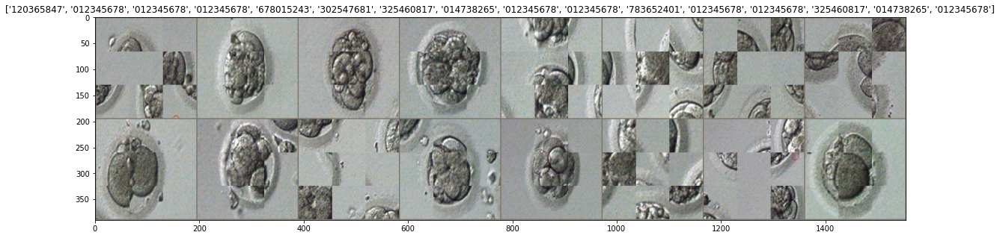

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(training_jigsaw_dataloader['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[training_jigsaw_datasets.classes[x] for x in classes])

>### Test Data

In [ ]:
test_jigsaw_datasets = datasets.ImageFolder(Path(path_jigsaw), jigsaw_transformation)
test_jigsaw_datasets.class_to_idx

{'012345678': 0,
 '012376584': 1,
 '013254768': 2,
 '014537826': 3,
 '014738265': 4,
 '103648725': 5,
 '105473682': 6,
 '107362854': 7,
 '120365847': 8,
 '231078456': 9,
 '234701658': 10,
 '235486071': 11,
 '237018564': 12,
 '302547681': 13,
 '321786045': 14,
 '325460817': 15,
 '451832076': 16,
 '456180273': 17,
 '460821753': 18,
 '542160378': 19,
 '547806132': 20,
 '567183402': 21,
 '658204137': 22,
 '678015243': 23,
 '678412305': 24,
 '783652401': 25,
 '784623510': 26,
 '786254130': 27,
 '840527361': 28,
 '865731024': 29,
 '876345210': 30}

In [ ]:
train_set, val_set = train_test_split(test_jigsaw_datasets, test_size=0.25, random_state=seed)

test_jigsaw_dataloader = {
    'train': DataLoader(train_set, batch_size=16, shuffle=True),
    'test': DataLoader(val_set, batch_size=16, shuffle=False)
}

In [ ]:
len(test_jigsaw_dataloader['train'].dataset),len(test_jigsaw_dataloader['test'].dataset)

(1839, 613)

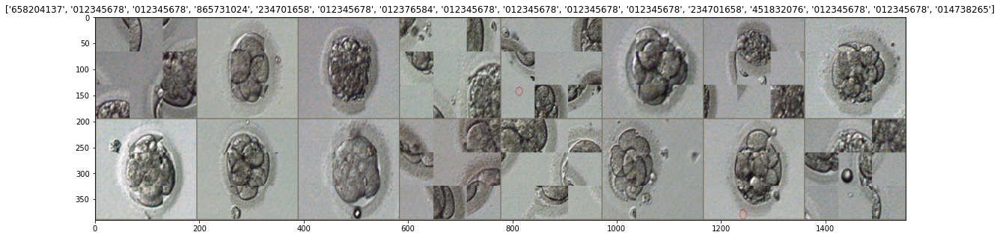

In [ ]:
# Get a batch of training data
inputs, classes = next(iter(test_jigsaw_dataloader['test']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
plt.figure(figsize=(20,5))
imshow(out, title=[test_jigsaw_datasets.classes[x] for x in classes])

# __*Functions*__

## Grad-CAM

> ### Grad-CAM main functions

In [20]:
class FeatureExtractor():
    """ Class for extracting activations and
    registering gradients from targetted intermediate layers """

    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []

    def save_gradient(self, grad):
        self.gradients.append(grad)

    def __call__(self, x):
        outputs = []
        self.gradients = []
        for name, module in self.model._modules.items():
            x = module(x)
            if name in self.target_layers:
                x.register_hook(self.save_gradient)
                outputs += [x]
        return outputs, x

class ModelOutputs():
    """ Class for making a forward pass, and getting:
    1. The network output.
    2. Activations from intermeddiate targetted layers.
    3. Gradients from intermeddiate targetted layers. """

    def __init__(self, model, feature_module, target_layers):
        self.model = model
        self.feature_module = feature_module
        self.feature_extractor = FeatureExtractor(self.feature_module, target_layers)

    def get_gradients(self):
        return self.feature_extractor.gradients

    def __call__(self, x):
        target_activations = []
        for name, module in self.model._modules.items():
            if module == self.feature_module:
                target_activations, x = self.feature_extractor(x)
            elif "avgpool" in name.lower():
                x = module(x)
                x = x.view(x.size(0),-1)
            else:
                x = module(x)

        return target_activations, x

def preprocess_image(img):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
    preprocessing = transforms.Compose([
        transforms.ToTensor(),
        normalize,
    ])
    return preprocessing(img.copy()).unsqueeze(0)

def show_cam_on_image(img, mask):
    heatmap = cv2.applyColorMap(np.uint8(255 * (1-mask)), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap / 255)
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

class GradCam:
    def __init__(self, model, feature_module, target_layer_names, use_cuda):
        self.model = model
        self.feature_module = feature_module
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        self.extractor = ModelOutputs(self.model, self.feature_module, target_layer_names)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):
        if self.cuda:
            input_img = input_img.cuda()

        features, output = self.extractor(input_img)

        if target_category == None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()
        
        one_hot = torch.sum(one_hot * output)

        self.feature_module.zero_grad()
        self.model.zero_grad()
        one_hot.backward(retain_graph=True)

        grads_val = self.extractor.get_gradients()[-1].cpu().data.numpy()

        target = features[-1]
        target = target.cpu().data.numpy()[0, :]

        weights = np.mean(grads_val, axis=(2, 3))[0, :]
        cam = np.zeros(target.shape[1:], dtype=np.float32)

        for i, w in enumerate(weights):
            cam += w * target[i, :, :]

        cam = np.maximum(cam, 0)
        cam = cv2.resize(cam, input_img.shape[2:])
        cam = cam - np.min(cam)
        cam = cam / np.max(cam)
        return cam


class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        positive_mask = (input_img > 0).type_as(input_img)
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        input_img, output = self.saved_tensors
        grad_input = None

        positive_mask_1 = (input_img > 0).type_as(grad_output)
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input


class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category == None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)
        one_hot.backward(retain_graph=True)

        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]

        return output

def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img*255)

>### Grad-CAM implementation functions

In [21]:
def get_input_test_phase(input_dict_test):
  input_image_numpy = list()

  for batch in input_dict_test['inputs']:
    for image in batch:
      input_image_numpy.append(image)
  return input_image_numpy

In [22]:
def display_grad(i,img, cam, cam_gb, target_category):
  plt.figure(figsize=(20,3))

  plt.subplot(1,5,1)
  plt.title('#'+str(i)+': original img :' )
  plt.imshow(img)

  ## True Label
  plt.subplot(1,5,2)
  plt.title('#'+str(i)+': Grad-CAM, TRUE LABEL = '+str(target_category[0]))
  plt.imshow(cam[0])

  plt.subplot(1,5,3)
  plt.title('#'+str(i)+': Guided Grad-CAM, TRUE LABEL = '+str(target_category[0]))
  plt.imshow(cam_gb[0])

  ## Predicted Label
  plt.subplot(1,5,4)
  plt.title('#'+str(i)+': Grad-CAM, PRED LABEL = '+str(target_category[1]))
  plt.imshow(cam[1])

  plt.subplot(1,5,5)
  plt.title('#'+str(i)+': Guided Grad-CAM, PRED LABEL = '+str(target_category[1]))
  plt.imshow(cam_gb[1])


In [23]:
def get_heatmap_avg(grayscale_cam):
  heatmap = cv2.applyColorMap(np.uint8(255 * (1-grayscale_cam)), cv2.COLORMAP_JET)
  heatmap = np.float32(heatmap / 255)

  ## 1st row
  tile_00 = heatmap[:56, :56]
  tile_01 = heatmap[:56, 56:112]
  tile_02 = heatmap[:56, 112:168]
  tile_03 = heatmap[:56, 168:224]
  ## 2nd row
  tile_10 = heatmap[56:112, :56]
  tile_11 = heatmap[56:112, 56:112]
  tile_12 = heatmap[56:112, 112:168]
  tile_13 = heatmap[56:112, 168:224]
  ## 3rd row
  tile_20 = heatmap[112:168, :56]
  tile_21 = heatmap[112:168, 56:112]
  tile_22 = heatmap[112:168, 112:168]
  tile_23 = heatmap[112:168, 168:224]
  ## 4th row
  tile_30 = heatmap[168:224, :56]
  tile_31 = heatmap[168:224, 56:112]
  tile_32 = heatmap[168:224, 112:168]
  tile_33 = heatmap[168:224, 168:224]
  
  img_tiles = [tile_00,tile_01,tile_02,tile_03,
               tile_10,tile_11,tile_12,tile_13,
               tile_20,tile_21,tile_22,tile_23,
               tile_30,tile_31,tile_32,tile_33]
  tiles_avg = list()


  for tile in img_tiles:
    df = pd.DataFrame({"r":[],"g":[],"b":[]})
    for row in range(len(tile)):
      df_add = pd.DataFrame(tile[row], columns=["r","g","b"])
      df = df.append(df_add, ignore_index=True)

    ## red pixel avg per tile
    tiles_avg.append(np.mean(df["r"]))

  if len(tiles_avg) == 16:
    return tiles_avg
  else:
    raise ValueError("unmatch average to image dimensions")

In [24]:
def display_grad_cam(input_image_numpy, labels_image_numpy, path, val_dl, cls, model_name, case, display_res = True):

  if len(input_image_numpy) == len(labels_image_numpy['true_labels']) and len(labels_image_numpy['true_labels']) == len(labels_image_numpy['predicted_labels']):

    heatmap_avg_df_pred = pd.DataFrame({"00":[],"01":[],"02":[],"03":[],
                                        "10":[],"11":[],"12":[],"13":[],
                                        "20":[],"21":[],"22":[],"23":[],
                                        "30":[],"31":[],"32":[],"33":[]})
    heatmap_avg_df_true = pd.DataFrame({"00":[],"01":[],"02":[],"03":[],
                                        "10":[],"11":[],"12":[],"13":[],
                                        "20":[],"21":[],"22":[],"23":[],
                                        "30":[],"31":[],"32":[],"33":[]})
    
    ## loop through images START
    tqdm_des = "Grad-CAM : "+str(model_name)+" ("+str(case)+")"
    for i in tqdm(range(len(input_image_numpy)), desc=tqdm_des):      
      img_init = input_image_numpy[i]
      img_init = img_init.transpose(1,2,0)

      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      inp = std * img_init + mean
      inp = np.clip(inp, 0, 1)
      img = np.float32(inp)

      input_img = preprocess_image(img)

      cam_gb_ls = list()
      cam_ls = list()
      target_category_ls = list()

      for mode in ['true_labels','predicted_labels']:
        grad_model = learner(models.resnet50(pretrained=False),val_dl, cls)
        grad_model['model'].load_state_dict(torch.load(path))

        grad_cam = GradCam(model=grad_model['model'], 
                           feature_module=grad_model['model'].layer4, # layer4 adalah layer terakhir untuk Resnet50
                           target_layer_names=["2"], use_cuda=True)
        target_category = labels_image_numpy[mode][i]
        grayscale_cam = grad_cam(input_img, target_category)
        grayscale_cam = cv2.resize(grayscale_cam, (img.shape[1], img.shape[0]))


        if display_res == True:
          cam = show_cam_on_image(img, grayscale_cam)

          gb_model = GuidedBackpropReLUModel(model=grad_model['model'], use_cuda=True)
          gb = gb_model(input_img, target_category=target_category)
          gb = gb.transpose((1, 2, 0))

          cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam])
          cam_gb = deprocess_image(cam_mask*gb)
          gb = deprocess_image(gb)

          cam_gb_ls.append(cam_gb)
          cam_ls.append(cam)
          target_category_ls.append(target_category)

          # display_grad(i,img,cam_ls,cam_gb_ls,target_category_ls)

        else:
          ## save heatmap image START ##
          if (case == "positive") and (mode == "true_labels"):
            pass
          else:
            heatmap_tosave = cv2.applyColorMap(np.uint8(255 * (1-grayscale_cam)), cv2.COLORMAP_JET)
            path_tosave_heatmap = str(model_name)+'/'+str(case)+'-'+str(model_name)+'-'+str(mode[:4])+'-'+str(target_category)+'-'+str(time.time())+'.png'
            im_tosave = Image.fromarray(heatmap_tosave)
            if im_tosave.mode == "F":
                im_tosave = im_tosave.convert('RGB')
            im_tosave.save(str_path_grad+'/'+path_tosave_heatmap)
          ## save heatmap image END ##

          # ## when result not displayed, the most crusial grad-CAM result only the heatmap,
          # ## so further action is unnecessary
          # ## save heatmap mapping rgb value for predicted and true label
          # if mode == 'predicted_labels':
          #   tiles_avg = get_heatmap_avg(grayscale_cam)
          #   tiles_avg_val = np.array([tiles_avg])
          #   new_tiles_avg = pd.DataFrame(tiles_avg_val, columns=["00","01","02","03",
          #                                                       "10","11","12","13",
          #                                                       "20","21","22","23",
          #                                                       "30","31","32","33",])
          #   heatmap_avg_df_pred = heatmap_avg_df_pred.append(new_tiles_avg, ignore_index=True)
          # elif mode == 'true_labels':
          #   tiles_avg = get_heatmap_avg(grayscale_cam)
          #   tiles_avg_val = np.array([tiles_avg])
          #   new_tiles_avg = pd.DataFrame(tiles_avg_val, columns=["00","01","02","03",
          #                                                       "10","11","12","13",
          #                                                       "20","21","22","23",
          #                                                       "30","31","32","33",])
          #   heatmap_avg_df_true = heatmap_avg_df_true.append(new_tiles_avg, ignore_index=True)
          # else:
          #   raise ValueError("undefined mode : ",mode)

      if display_res == True:
        display_grad(i,img,cam_ls,cam_gb_ls,target_category_ls)
    ## loop through images END

    # ## save training model for testing if not displayed
    # if display_res == False:
    #   path_tosave_heatmap_avg_pred = str(model_name)+'/'+str(case)+'/pred/gradcam_pred_heatmap_avg.csv'
    #   heatmap_avg_df_pred.to_csv(path_grad_cam/str(path_tosave_heatmap_avg_pred))

    #   path_tosave_heatmap_avg_true = str(model_name)+'/'+str(case)+'/true/gradcam_true_heatmap_avg.csv'
    #   heatmap_avg_df_true.to_csv(path_grad_cam/str(path_tosave_heatmap_avg_true))
    
  # else:
  #   raise(ValueError('labels_image_numpy["true_labels"]='+str(len(labels_image_numpy['true_labels']))+
  #                    ', labels_image_numpy["predicted_labels"]='+str(len(labels_image_numpy['true_labels']))+
  #                    ', input_image_numpy='+str(len(input_image_numpy))+
  #                    '\n\n All values must be equals'))

## Training, Learner, Validate, Pretext, Downstream functions

> ### Training f(x)

In [25]:
## based on https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html with modification
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25, ploting=True):
  since = time.time()

  best_model_wts = copy.deepcopy(model.state_dict())
  best_acc = 0.0
  total_train_loss = list()
  total_val_loss = list()
  total_train_acc = list()
  total_val_acc = list()
  y_pred_confmatrix = list()
  y_true_confmatrix = list()

  for epoch in tqdm(range(num_epochs), desc='Epoch :'):
    # Each epoch has a training and validation phase
    for phase in ['train', 'val']:
      inputs_tensor_batch = list()
      y_pred = list()
      y_true = list()

      if phase == 'train':
        model.train()  # Set model to training mode
      else:
        model.eval()   # Set model to evaluate mode

      running_loss = 0.0
      running_corrects = 0

      ######## Iterate over data START. ########
      for inputs, labels in dataloaders[phase]:
        inputs = inputs.to(device)
        labels = labels.to(device)
          
        # zero the parameter gradients
        optimizer.zero_grad()

        # forward
        # track history if only in train
        with torch.set_grad_enabled(phase == 'train'):
          outputs = model(inputs)
          _, preds = torch.max(outputs, 1)
          loss = criterion(outputs, labels)

          # backward + optimize only if in training phase
          if phase == 'train':
            loss.backward()
            optimizer.step()

        # statistics
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)

        ## Record label, prediction and each input
        prediction_res = preds
        true_labels = labels.data
        input_tensor_data = inputs.data

        y_pred.append(list(prediction_res.cpu().numpy()))
        y_true.append(list(true_labels.cpu().numpy()))
        # inputs_tensor_batch.append(list(input_tensor_data.cuda().numpy()))
      ######## Iterate over data END. ########

      if phase == 'train':
        scheduler.step()

      epoch_loss = running_loss / len(dataloaders[phase].dataset)
      epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

      # Record loss and acc to display in graph
      if phase == "train":
        total_train_loss.append(epoch_loss)
        total_train_acc.append(epoch_acc.item())
      else:
        total_val_loss.append(epoch_loss)
        total_val_acc.append(epoch_acc.item())


      # deep copy the model and make dictionary of recorded label, prediction and input for <phase == 'test'>
      if phase == 'val' and epoch_acc > best_acc:
        best_acc = epoch_acc

        best_model_wts = copy.deepcopy(model.state_dict())

        y_pred_confmatrix = list(np.concatenate(y_pred).flat)
        y_true_confmatrix = list(np.concatenate(y_true).flat)

        ## input dictionary
        recorded_val = {'true_labels':y_true_confmatrix, 'predicted_labels':y_pred_confmatrix}

  ## display in DataFrame format
  result_dict = {'train_loss': total_train_loss,
                 'val_loss':total_val_loss,
                 'train_acc':total_train_acc,
                 'val_acc': total_val_acc}
  result_df = pd.DataFrame(result_dict)
  display(result_df)

  print()

  time_elapsed = time.time() - since
  print('Training complete in {:.0f}m {:.0f}s'.format(
      time_elapsed // 60, time_elapsed % 60))
  print('Best val Acc: {:4f}'.format(best_acc))

  ## Ploting loss and accuracy

  if ploting:
    plt.figure(figsize=(15,5))

    plt.subplot(1,2,1)
    loss_plot = plt.plot(total_train_loss, label="train loss")
    loss_plot = plt.plot(total_val_loss, label="val loss")
    plt.title("Loss")
    plt.ylabel('loss')
    plt.xlabel('epoch #')
    plt.legend()
    loss_dict = {'train_loss': total_train_loss,
                'val_loss': total_val_loss,}

    plt.subplot(1,2,2)
    acc_plot = plt.plot(total_train_acc, label="train acc")
    acc_plot = plt.plot(total_val_acc, label="val acc")
    plt.title("Accuracy")
    plt.ylabel('acc')
    plt.xlabel('epoch #')
    plt.legend()
    acc_dict = {'train_acc': total_train_acc,
                'val_acc': total_val_acc,}
    plt.show()

  # load best model weights
  model.load_state_dict(best_model_wts)
  acc = accuracy_score(recorded_val['true_labels'], recorded_val['predicted_labels'])
  conf_mat = confusion_matrix(recorded_val['true_labels'], recorded_val['predicted_labels'])

  return model,result_dict,acc,conf_mat, recorded_val

> ### Learner f(x)

In [26]:
def learner(arch, dataloader, len_cls, epoch=8, fc_config="default",
            optimizer_mode='sgd', lr_val=0.005, momentum_val=0.9, decay=1e-6):
  ## model architecture
  model = arch
  ## model fully-connected layer
  num_ftrs = model.fc.in_features
  if fc_config == 'multi':
    raise ValueError("unavailable fc_config.")
    # model.fc = nn.Sequential(nn.BatchNorm1d(num_ftrs),
    #                         nn.Linear(num_ftrs, 1024),
    #                         nn.ReLU(inplace=True),
    #                         nn.BatchNorm1d(1024),
    #                         nn.Linear(1024,512),
    #                         nn.ReLU(inplace=True),
    #                         nn.BatchNorm1d(512),
    #                         nn.Linear(512,256),
    #                         nn.ReLU(inplace=True),
    #                         nn.BatchNorm1d(256),
    #                         nn.Linear(256,len_cls),
    #                         nn.Softmax(dim=1)
    #                         )
  elif fc_config == 'default':
    model.fc = nn.Sequential(nn.Linear(2048, 512),
                             nn.BatchNorm1d(512),
                             nn.ReLU(inplace=True),
                             nn.Linear(512, len_cls),
                             nn.Softmax(dim=1)
                            )
  else:
    raise ValueError("unknown fc_config. Available config ['default', 'multi']")


  model = model.to(device)

  model_criterion = nn.CrossEntropyLoss()

  if optimizer_mode == 'sgd':
    model_optimizer = optim.SGD(model.parameters(), lr=lr_val, momentum=momentum_val)
  elif optimizer_mode == 'adam':
    model_optimizer = optim.Adam(model.parameters(), lr=lr_val, weight_decay=decay)
  else:
    raise ValueError("unknown model_optimizer. Available config ['sgd', 'adam']")

  exp_lr_scheduler = lr_scheduler.OneCycleLR(model_optimizer, max_lr=lr_val, 
                                             steps_per_epoch=2*len(dataloader), 
                                             epochs=epoch)

  ret_dict= {'model': model, 'criterion':model_criterion,
             'optimizer': model_optimizer, 'lr_scheduler':exp_lr_scheduler}
  
  return ret_dict

> ### Test f(x)

In [27]:
def test_model(model_learner, valid_dl):
  model = model_learner['model']
  criterion = model_learner['criterion']
  model.eval()
  correct_pred = 0
  false_pred = 0
  y_true = list()
  y_pred = list()
  running_loss = 0.0
  running_corrects = 0
  inputs_tensor_batch = list()
  
  ######## Iterate over data START. ########
  for inputs, labels in tqdm(valid_dl['test'], desc="Testing "):
    inputs = inputs.to(device)
    labels = labels.to(device)

    
    outputs = model(inputs)
    _, preds = torch.max(outputs, 1)
    loss = criterion(outputs, labels)

    prediction_res = preds
    true_labels = labels.data
    input_tensor_data = inputs.data

    y_pred.append(list(prediction_res.cpu().numpy()))
    y_true.append(list(true_labels.cpu().numpy()))
    inputs_tensor_batch.append(list(input_tensor_data.cpu().numpy()))
    
    running_loss += loss.item() * inputs.size(0)
    running_corrects += torch.sum(preds == labels.data)
  ######## Iterate over data END. ########

  y_pred_confmatrix = list(np.concatenate(y_pred).flat)
  y_true_confmatrix = list(np.concatenate(y_true).flat)

  ## input dictionary
  recorded_test = {'inputs': inputs_tensor_batch, 'true_labels':y_true_confmatrix, 'predicted_labels':y_pred_confmatrix}

  loss = running_loss / len(valid_dl['test'].dataset)

  acc = running_corrects.double() / len(valid_dl['test'].dataset)
  conf_mat = confusion_matrix(recorded_test['true_labels'], recorded_test['predicted_labels'])
  
  return acc, loss, conf_mat, recorded_test

>### Pretext tasks f(x)

>>#### SimCLRv1
*training & testing : https://github.com/leftthomas/SimCLR* <br>
*LARS Optimizer citation : https://github.com/kakaobrain/torchlars*

>>##### Model SimCLRv1 :

In [28]:
class Model_SimCLR(nn.Module):
    def __init__(self,pretrained_arch, feature_dim=128):
        super(Model_SimCLR, self).__init__()
        
        self.f = []
        for name, module in models.resnet50(pretrained=pretrained_arch).named_children():
            if name == 'conv1':
                module = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
            if not isinstance(module, nn.Linear) and not isinstance(module, nn.MaxPool2d):
                self.f.append(module)
        # encoder
        self.f = nn.Sequential(*self.f)
        # projection head
        self.g = nn.Sequential(nn.Linear(2048, 512, bias=False), nn.BatchNorm1d(512),
                               nn.ReLU(inplace=True), nn.Linear(512, feature_dim, bias=True))

    def forward(self, x):
        x = self.f(x)
        feature = torch.flatten(x, start_dim=1)
        out = self.g(feature)
        return F.normalize(feature, dim=-1), F.normalize(out, dim=-1)

>>##### Training function

In [29]:
def train_simclr(net, data_loader, epoch_counter,
                 eps, train_optimizer, scheduler, temperature, k):

  net.train()
  total_loss, total_num, train_bar = 0.0, 0, data_loader
  for [pos_1, pos_2], target in train_bar:
    batch_size = len(pos_1)
    pos_1, pos_2 = pos_1.cuda(non_blocking=True), pos_2.cuda(non_blocking=True)

    feature_1, out_1 = net(pos_1)
    feature_2, out_2 = net(pos_2)
    # [2*B, D]
    out = torch.cat([out_1, out_2], dim=0)

    # [2*B, 2*B]
    sim_matrix = torch.exp(torch.mm(out, out.t().contiguous()) / temperature)
    mask = (torch.ones_like(sim_matrix) - torch.eye(2 * batch_size, device=sim_matrix.device)).bool()
    # [2*B, 2*B-1]

    sim_matrix = sim_matrix.masked_select(mask).view(2 * batch_size, -1)

    # compute loss
    pos_sim = torch.exp(torch.sum(out_1 * out_2, dim=-1) / temperature)
    # [2*B]
    pos_sim = torch.cat([pos_sim, pos_sim], dim=0)
    loss = (- torch.log(pos_sim / sim_matrix.sum(dim=-1))).mean()
    train_optimizer.zero_grad()
    loss.backward()
    train_optimizer.step()

    total_num += batch_size
    total_loss += loss.item() * batch_size

    epoch_loss = total_loss/total_num
  
  # warmup for the first 10 epochs
  if epoch_counter >= 10:
    scheduler.step()

  return net, epoch_loss

>>##### Testing function

In [30]:
def test_simclr(net, memory_data_loader, test_data_loader, temperature, k, cls_len):
  net.eval()
  total_top1, total_top2, total_num, feature_bank = 0.0, 0.0, 0, []
  with torch.no_grad():
    # generate feature bank
    for [data, _], target in memory_data_loader:
      feature, out = net(data.cuda(non_blocking=True))
      feature_bank.append(feature)
    # [D, N]
    feature_bank = torch.cat(feature_bank, dim=0).t().contiguous()
    # [N]
    feature_labels = torch.tensor(memory_data_loader.dataset.targets, device=feature_bank.device)
    # loop test data to predict the label by weighted knn search
    # test_bar = tqdm(test_data_loader)
    for [data, _], target in test_data_loader:
      data, target = data.cuda(non_blocking=True), target.cuda(non_blocking=True)
      feature, out = net(data)

      total_num += data.size(0)
      # compute cos similarity between each feature vector and feature bank ---> [B, N]
      sim_matrix = torch.mm(feature, feature_bank)
      # [B, K]
      sim_weight, sim_indices = sim_matrix.topk(k=k, dim=-1)
      # [B, K]
      sim_labels = torch.gather(feature_labels.expand(data.size(0), -1), dim=-1, index=sim_indices)
      sim_weight = (sim_weight / temperature).exp()

      # counts for each class
      one_hot_label = torch.zeros(data.size(0) * k, cls_len, device=sim_labels.device)
      # [B*K, C]
      one_hot_label = one_hot_label.scatter(dim=-1, index=sim_labels.view(-1, 1), value=1.0)
      # weighted score ---> [B, C]
      pred_scores = torch.sum(one_hot_label.view(data.size(0), -1, cls_len) * sim_weight.unsqueeze(dim=-1), dim=1)

      pred_labels = pred_scores.argsort(dim=-1, descending=True)
      total_top1 += torch.sum((pred_labels[:, :1] == target.unsqueeze(dim=-1)).any(dim=-1).float()).item()
      total_top2 += torch.sum((pred_labels[:, :2] == target.unsqueeze(dim=-1)).any(dim=-1).float()).item()
      # test_bar.set_description('Test Epoch: [{}/{}] Acc@1:{:.2f}% Acc@5:{:.2f}%'
      #                           .format(epoch, epochs, total_top1 / total_num * 100, total_top5 / total_num * 100))

  return total_top1 / total_num * 100, total_top2 / total_num * 100

>>##### SimCLRv1 function

In [31]:
## LARS Optimizer citation : https://github.com/kakaobrain/torchlars || training & testing : https://github.com/leftthomas/SimCLR

def simclr_pretext(save_path, pretrained_arch, train_dl,
                   memory_loader, test_loader, eps, cls_len,
                   feature_dim, fig_size, mode):

  ### --- ATTRIBUTES DECLARATION --- ###
  feature_dim, temperature, k = feature_dim, 0.5, 10
  best_acc_top1, best_acc_top2 = 0,0

  model = Model_SimCLR(pretrained_arch, feature_dim).cuda()
  base_optimizer = optim.Adam(model.parameters(), lr=5e-3, weight_decay=1e-6)
  optimizer = LARS(optimizer=base_optimizer, eps=eps)
  scheduler = lr_scheduler.CosineAnnealingLR(optimizer, 
                                             T_max=len(training_simclr_dataloader['train']), 
                                                       eta_min=0,
                                                       last_epoch=-1)
  

  results = {'train_loss': [], 'val_acctop1': [], 'val_acctop2': []}
  best_model_wts = model
  for epoch in  tqdm(range(eps), desc='Epoch :'):
    ### --- TRAINING & VALIDATION PHASE --- ###
    trained_model, train_loss= train_simclr(model, train_dl,
                                            epoch,
                                            eps,
                                            optimizer, scheduler,
                                            temperature, k)
    results['train_loss'].append(train_loss)


    ### --- TESTING PHASE --- ###
    val_acc_1, val_acc_2 = test_simclr(model, memory_loader, test_loader, temperature, k, cls_len)
    results['val_acctop1'].append(val_acc_1)
    results['val_acctop2'].append(val_acc_2)

    if val_acc_1 > best_acc_top1:
      best_model_wts = trained_model
    
  torch.save(best_model_wts.state_dict(), path_models/str(save_path))

  ## save testing result
  df_res_simclr = pd.DataFrame(results)
  display(df_res_simclr)
  path_tosave_pretext = 'pretext/'+str(mode)+'_pretext_result.csv'
  df_res_simclr.to_csv(path_result/str(path_tosave_pretext))

  ### --- Ploting the result(s) --- ###
  plt.figure(figsize=fig_size)

  plt.subplot(1,2,1)
  loss_plt = plt.plot(df_res_simclr['train_loss'])
  plt.title('Training ConfMet')
  plt.ylabel('loss')
  plt.xlabel('epoch')

  plt.subplot(1,2,2)
  acc_plt = plt.plot(df_res_simclr['val_acctop1'], label="top 1")
  acc_plt = plt.plot(df_res_simclr['val_acctop2'], label="top 2")
  plt.title('Test ConfMet')
  plt.ylabel('acc')
  plt.xlabel('epoch')
  plt.legend()
  plt.show()

>>#### Jigsaw Puzzle and Rotation

In [32]:
def jigsaw_rotation_pretext(save_path, pretrained_arch,
                            train_dl, test_dl, eps, len_cls, fig_size, mode):
  acc_ls = list()
  loss_ls = list()


  ### --- TRAINING & VALIDATION PHASE --- ###
  learner_model = learner(models.resnet50(pretrained=pretrained_arch), 
                          train_dl, len_cls, epoch=eps, fc_config="default", 
                          optimizer_mode='sgd', lr_val=5e-3, momentum_val=0.9, decay=1e-6)
    
  pretext_trained_model,train_result_dict,acc,confmatrix,_ = train_model(learner_model['model'],
                                                                         train_dl,
                                                                         learner_model['criterion'], 
                                                                         learner_model['optimizer'],
                                                                         learner_model['lr_scheduler'],
                                                                         num_epochs=eps)  
  torch.save(pretext_trained_model.state_dict(), 
             path_models/str(save_path))
    
  ## save training result
  df_result_dict = pd.DataFrame(train_result_dict)
  path_tosave_pretext_training = 'pretext/'+str(mode)+'_pretext_train_result.csv'
  df_result_dict.to_csv(path_result/str(path_tosave_pretext_training))
      

  ### --- TESTING PHASE --- ### 
  test_learner = learner(models.resnet50(pretrained=pretrained_arch),
                         test_dl, len_cls, epoch=eps, fc_config="default",
                         optimizer_mode='sgd', lr_val=5e-3, momentum_val=0.9, decay=1e-6)
  test_learner['model'].load_state_dict(torch.load(path_models/str(save_path)))

  acc_val, loss_val, conf_mat,_ = test_model(test_learner, test_dl)
  print('best acc using sklearn: ',acc)
  print("\nTest Accuracy : %.4f"%(acc_val))
  print("\nTest Loss : %.4f \n"%(loss_val))
  acc_ls.append(acc_val.item())
  loss_ls.append(loss_val)

  ## save testing result
  df_res_jigrot = pd.DataFrame({'acc':acc_ls,'loss':loss_ls})
  path_tosave_pretext = 'pretext/'+str(mode)+'_pretext_result.csv'
  df_res_jigrot.to_csv(path_result/str(path_tosave_pretext))

  ### --- Ploting the result(s) --- ###
  plt.figure(figsize=fig_size)

  plt.subplot(1,2,1)
  training_matric = sns.heatmap(confmatrix, annot=True, fmt='d', cmap='Blues')
  plt.title('Training ConfMet')
  plt.ylabel('True')
  plt.xlabel('Pred')

  plt.subplot(1,2,2)
  valid_matric = sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
  plt.title('Test ConfMet')
  plt.ylabel('True')
  plt.xlabel('Pred')
  plt.show()


>### Downstream f(x)

>>#### Main function

In [33]:
def downstream_task(training_dataloader, test_dataloader, downstram_cls_len, pretrained_arch,  mode, learner_path):
  training_res = list()
  acc_list = list()
  loss_list = list()

  best_test_acc = 0.0
  best_input_dict_test = None
  for i in range(5):
    print(">>>> loop %d : "%(i))
    learner_downstrm = learner(models.resnet50(pretrained=pretrained_arch), training_dataloader,downstram_cls_len,
                               fc_config="default", optimizer_mode='sgd', lr_val=0.005, momentum_val=0.9, decay=1e-6)
    
    ## "nopretext" don't need to load pretrained pretext model
    if str(mode) != "nopretext" and str(mode) != "nopretext_np":
      learner_downstrm['model'].load_state_dict(torch.load(path_models/str(learner_path)),
                                                strict=False)

    pretext_trained,training_result_dict,acc,confmatrix,_ = train_model(learner_downstrm['model'],
                                                                      training_dataloader,
                                                                      learner_downstrm['criterion'],
                                                                      learner_downstrm['optimizer'],
                                                                      learner_downstrm['lr_scheduler'],
                                                                      num_epochs=30,
                                                                      ploting=False)
    
    ## Record training result for every loop
    training_res.append(training_result_dict)
    
    ## save training model for testing
    trained_model_path = str(mode)+"_dwnstrm_model.pth"
    torch.save(pretext_trained.state_dict(), 
              path_models/trained_model_path)

    
    ## Test model 
    test_learner = learner(models.resnet50(pretrained=pretrained_arch), test_dataloader, downstram_cls_len,
                           fc_config="default", optimizer_mode='sgd', lr_val=0.005, momentum_val=0.9, decay=1e-6)
    test_learner['model'].load_state_dict(torch.load(path_models/trained_model_path))
    print('best acc using sklearn: ',acc)

    acc_val, loss_val, conf_mat, input_dict_test = test_model(test_learner, test_dataloader)
    print("\nTest Accuracy : %.4f "%(acc_val))
    print("\nTest Loss : %.4f \n"%(loss_val))
    acc_list.append(acc_val.item())
    loss_list.append(loss_val)

    if best_test_acc < acc_val:
      best_test_acc = acc_val
      best_input_dict_test = input_dict_test

      

    ## Plot Confussion Metric
    plt.figure(figsize=(15,5))

    plt.subplot(1,2,1)
    training_matric = sns.heatmap(confmatrix, annot=True, fmt='d', cmap='Blues')
    plt.title('Best Training ConfMet')
    plt.ylabel('True')
    plt.xlabel('Pred')

    plt.subplot(1,2,2)
    valid_matric = sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues')
    plt.title('Test ConfMet')
    plt.ylabel('True')
    plt.xlabel('Pred')
    plt.show()

  return acc_list, loss_list, training_res, best_input_dict_test, trained_model_path

>>#### Plot training graph f(x)

In [34]:
## Plot Training graph
def plot_training(training_result, start_loss, end_loss, start_acc, end_acc):
  plt.figure(figsize=(30,8))

  ## LOSS
  plt.subplot(1,4,1)
  for idx in range(len(training_result)):
    training_loss_plot = plt.plot(training_result[idx]['train_loss'], label="loop "+str(idx))
  axes = plt.gca()
  axes.set_ylim([start_loss,end_loss])
  plt.title('Training loss')
  plt.legend()
  plt.ylabel('loss')
  plt.xlabel('epoch')

  plt.subplot(1,4,2)
  for idx in range(len(training_result)):
    validation_loss_plot = plt.plot(training_result[idx]['val_loss'], label="loop "+str(idx))
  axes = plt.gca()
  axes.set_ylim([start_loss,end_loss])
  plt.title('Validation loss')
  plt.legend()
  plt.ylabel('loss')
  plt.xlabel('epoch')

  ## ACC
  plt.subplot(1,4,3)
  for idx in range(len(training_result)):
    training_loss_plot = plt.plot(training_result[idx]['train_acc'], label="loop "+str(idx))
  axes = plt.gca()
  axes.set_ylim([start_acc,end_acc])
  plt.title('Training acc')
  plt.legend()
  plt.ylabel('acc')
  plt.xlabel('epoch')

  plt.subplot(1,4,4)
  for idx in range(len(training_result)):
    validation_loss_plot = plt.plot(training_result[idx]['val_acc'], label="loop "+str(idx))
  axes = plt.gca()
  axes.set_ylim([start_acc,end_acc])
  plt.title('Validation acc')
  plt.legend()
  plt.ylabel('acc')
  plt.xlabel('epoch')

  plt.show()

# **_Model Training_**

## **Pretext task Training**

>### ResNet50 pretrained ImageNet == __True__

>>#### __SimCLR v1__

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Epoch ::   0%|          | 0/70 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/torchlars/lars.py:140: UserWarning: This overload of add_ is deprecated:
	add_(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	add_(Tensor other, *, Number alpha) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:1005.)
  p.grad.add_(weight_decay, p.data)
Epoch :: 100%|██████████| 70/70 [2:20:29<00:00, 120.42s/it]


,train_loss,val_acctop1,val_acctop2
0,3.438056,48.208469,81.107492
1,3.427306,42.671010,85.016287
2,3.429972,47.557003,85.342020
3,3.427447,45.276873,84.364821
4,3.429760,46.254072,81.758958
...,...,...,...
65,3.382556,44.299674,84.364821
66,3.380120,42.996743,83.713355
67,3.357601,41.368078,83.713355
68,3.367891,39.739414,83.713355


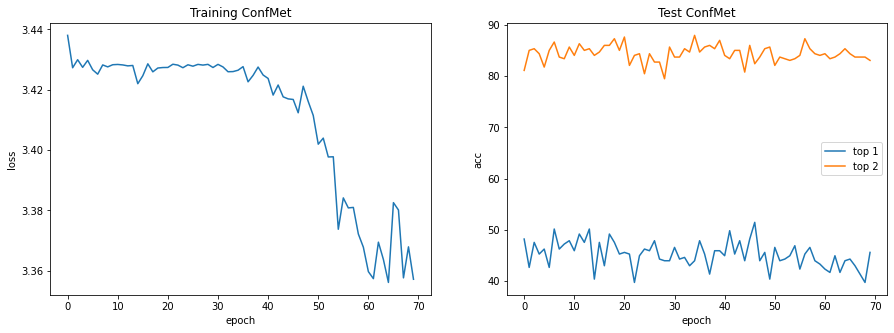

Phase pretext training complete in 140m 46s


In [ ]:
time_start = time.time()

simclr_pretext('pretext/simclrv1_trained_model.pth', True, 
               training_simclr_dataloader['train'],
               test_simclr_dataloader['train'],
               test_simclr_dataloader['test'], 
               eps=70,
               cls_len=len_class_simclr,
               feature_dim=128,
               fig_size = (15,5),
               mode='sim')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

>> #### **ROTATION**

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Epoch :: 100%|██████████| 70/70 [49:37<00:00, 42.53s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.037303,0.792473,0.787879,0.982337
1,0.802658,0.765138,0.966783,0.989810
2,0.781536,0.758969,0.976690,0.989810
3,0.768970,0.755432,0.985140,0.992527
4,0.770147,0.754875,0.983100,0.991848
...,...,...,...,...
65,0.743825,0.746499,1.000000,0.997283
66,0.743844,0.746905,1.000000,0.997283
67,0.744195,0.747249,0.999709,0.996603
68,0.744499,0.747438,0.999709,0.995924



Training complete in 49m 37s
Best val Acc: 0.998641


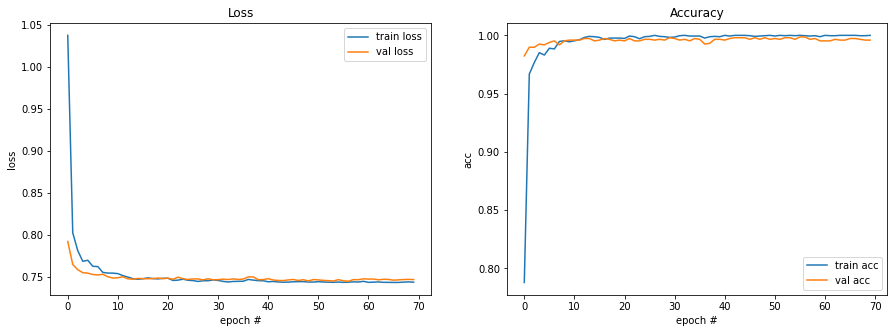

Testing : 100%|██████████| 77/77 [00:04<00:00, 16.52it/s]


best acc using sklearn:  0.998641304347826

Test Accuracy : 0.9984

Test Loss : 0.7461 



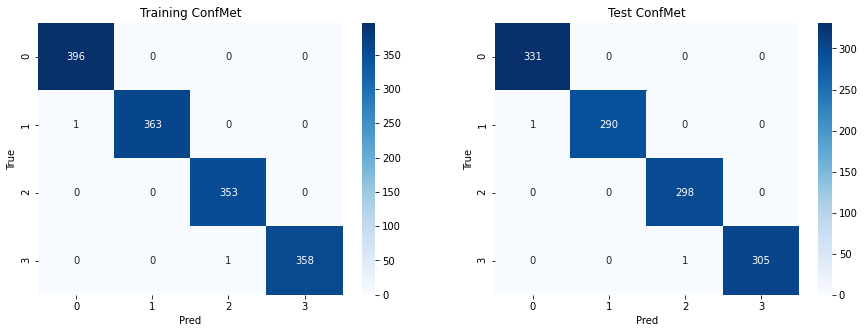

Phase pretext training complete in 49m 58s


In [ ]:
time_start = time.time()

jigsaw_rotation_pretext('pretext/rotation_trained_model.pth',
                        pretrained_arch=True,
                        train_dl = training_rotation_dataloader,
                        test_dl = test_rotation_dataloader,
                        eps = 70,
                        len_cls = len_class_rotation,
                        fig_size = (15,5),
                        mode='rot')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

>> #### **JIGSAW PUZZLE**

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Epoch :: 100%|██████████| 70/70 [42:06<00:00, 36.09s/it]


,train_loss,val_loss,train_acc,val_acc
0,3.424747,3.392869,0.123543,0.453804
1,3.199607,2.990728,0.509324,0.519022
2,2.982074,2.970152,0.524476,0.533967
3,2.970544,2.964494,0.520979,0.524457
4,2.966532,2.960989,0.532051,0.523098
...,...,...,...,...
65,2.490991,2.510262,0.999417,0.990489
66,2.491819,2.508743,0.998834,0.990489
67,2.490736,2.512689,0.999417,0.989130
68,2.490548,2.511109,0.999417,0.990489



Training complete in 42m 7s
Best val Acc: 0.993207


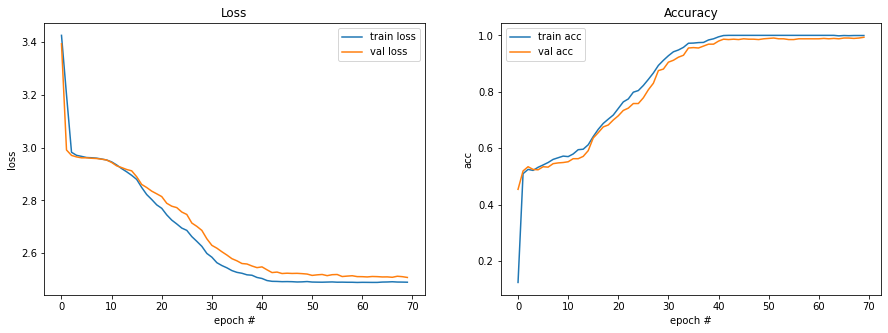

Testing : 100%|██████████| 39/39 [00:03<00:00, 10.91it/s]


best acc using sklearn:  0.9932065217391305

Test Accuracy : 0.9935

Test Loss : 2.5078 



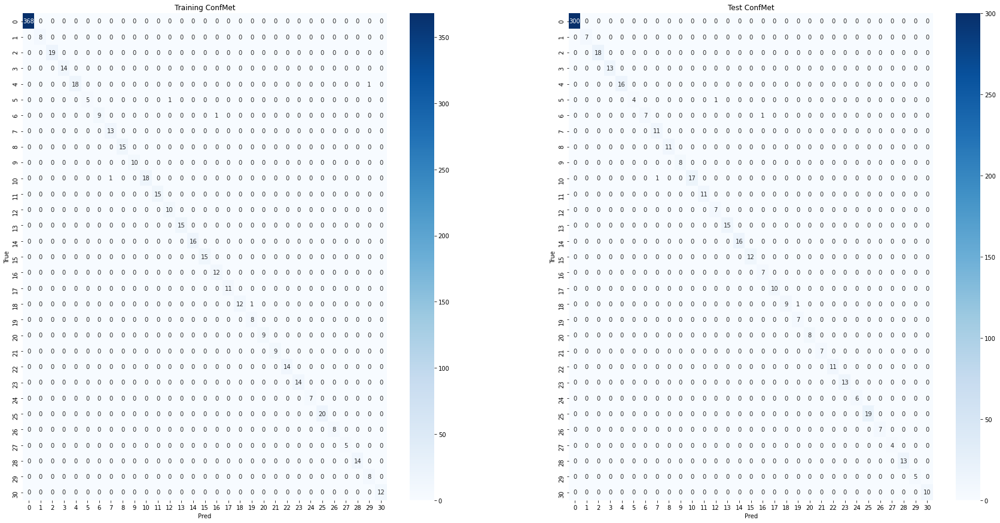

Phase pretext training complete in 42m 34s


In [ ]:
time_start = time.time()

jigsaw_rotation_pretext('pretext/jigsaw_trained_model.pth',
                        pretrained_arch=True,
                        train_dl = training_jigsaw_dataloader,
                        test_dl = test_jigsaw_dataloader,
                        eps = 70,
                        len_cls = len_class_jigsaw,
                        fig_size = (30,15),
                        mode='jig')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

>### ResNet50 pretrained ImageNet == __False__

>>#### __SimCLR v1__

Epoch :: 100%|██████████| 70/70 [2:19:54<00:00, 119.92s/it]


,train_loss,val_acctop1,val_acctop2
0,3.432629,45.602606,80.781759
1,3.427912,47.557003,84.690554
2,3.428302,45.602606,85.016287
3,3.427755,44.625407,83.061889
4,3.427846,43.973941,84.039088
...,...,...,...
65,3.419332,43.322476,82.410423
66,3.419652,44.625407,82.410423
67,3.412641,47.231270,84.039088
68,3.415213,41.368078,83.713355


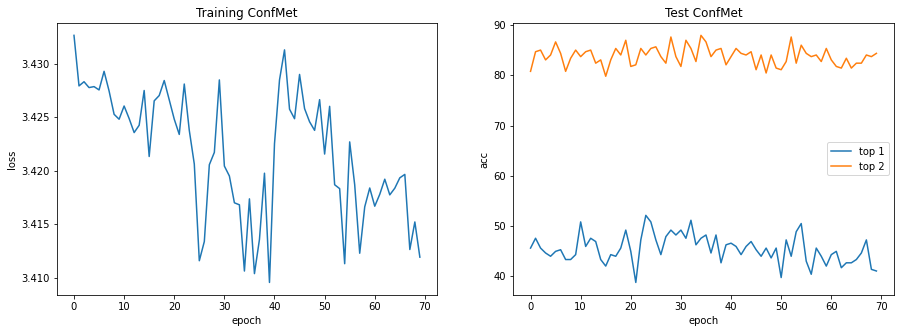

Phase pretext training complete in 139m 55s


In [ ]:
time_start = time.time()

simclr_pretext('pretext/simclrv1_trained_model_nopretrained.pth', False, 
               training_simclr_dataloader['train'],
               test_simclr_dataloader['train'],
               test_simclr_dataloader['test'], 
               eps=70,
               cls_len=len_class_simclr,
               feature_dim=128,
               fig_size = (15,5),
               mode='sim_notpretrained')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

>> #### **ROTATION**

Epoch :: 100%|██████████| 70/70 [49:59<00:00, 42.85s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.354187,1.323142,0.348485,0.402174
1,1.282495,1.227858,0.478147,0.616848
2,1.181716,1.125229,0.641026,0.694293
3,1.099296,1.106011,0.717075,0.665082
4,1.008802,0.919454,0.794872,0.862772
...,...,...,...,...
65,0.747180,0.749596,0.997669,0.993886
66,0.747544,0.749884,0.996795,0.994565
67,0.746721,0.749553,0.997669,0.993886
68,0.745442,0.749494,0.999417,0.994565



Training complete in 49m 60s
Best val Acc: 0.997962


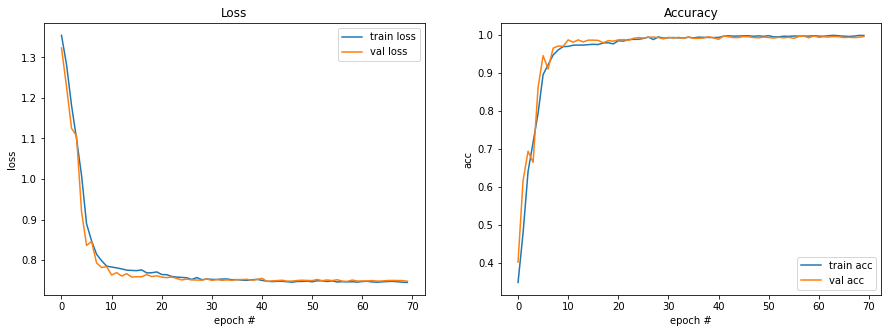

Testing : 100%|██████████| 77/77 [00:04<00:00, 17.10it/s]


best acc using sklearn:  0.9979619565217391

Test Accuracy : 0.9992

Test Loss : 0.7467 



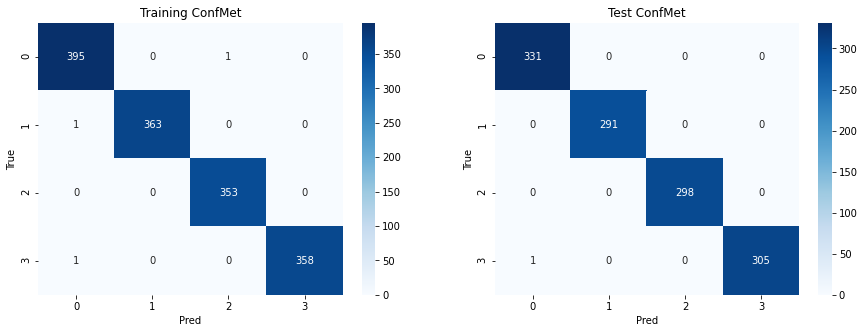

Phase pretext training complete in 50m 7s


In [ ]:
time_start = time.time()

jigsaw_rotation_pretext('pretext/rotation_trained_model_nopretrained.pth',
                        pretrained_arch=False,
                        train_dl = training_rotation_dataloader,
                        test_dl = test_rotation_dataloader,
                        eps = 70,
                        len_cls = len_class_rotation,
                        fig_size = (15,5),
                        mode='rot_notpretrained')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

>> #### **JIGSAW PUZZLE**

Epoch :: 100%|██████████| 70/70 [42:22<00:00, 36.32s/it]


,train_loss,val_loss,train_acc,val_acc
0,3.432468,3.384154,0.042541,0.255435
1,3.351933,3.275406,0.219697,0.296196
2,3.305674,3.278980,0.266317,0.309783
3,3.245127,3.220307,0.369464,0.467391
4,3.083539,3.026622,0.497669,0.500000
...,...,...,...,...
65,2.564020,2.606636,0.936480,0.908967
66,2.554342,2.597774,0.946970,0.922554
67,2.546997,2.586388,0.949301,0.918478
68,2.540656,2.569606,0.955711,0.955163



Training complete in 42m 22s
Best val Acc: 0.957880


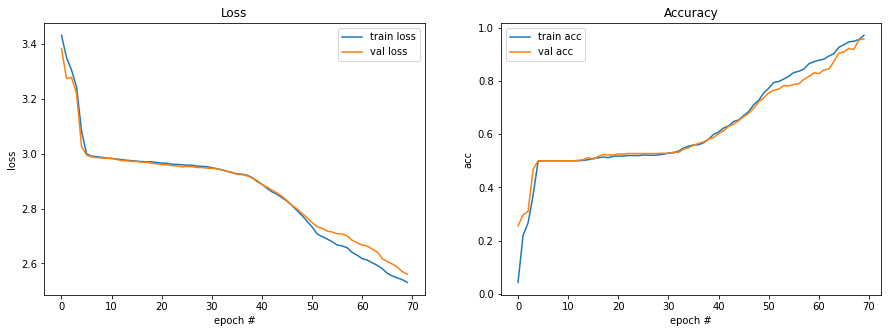

Testing : 100%|██████████| 39/39 [00:03<00:00, 11.14it/s]


best acc using sklearn:  0.9578804347826086

Test Accuracy : 0.9576

Test Loss : 2.5645 



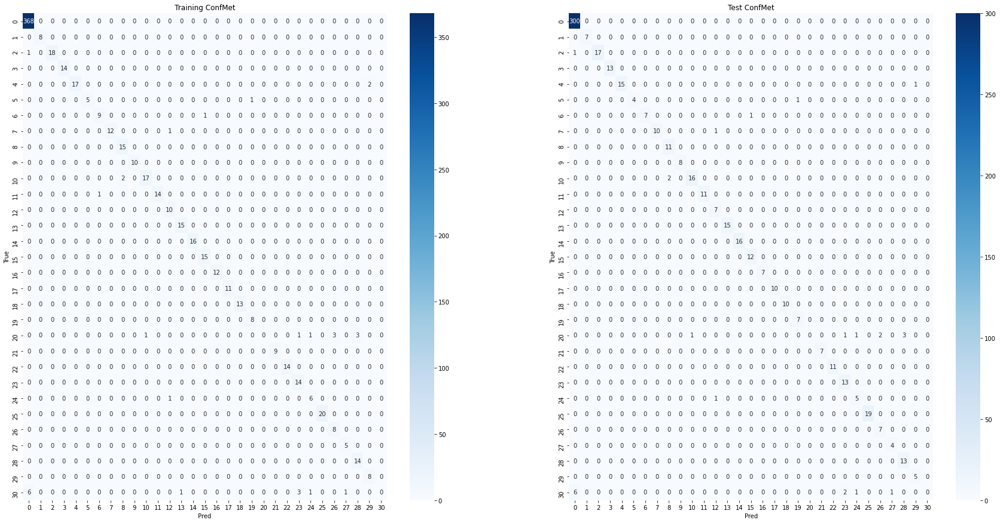

Phase pretext training complete in 42m 37s


In [ ]:
time_start = time.time()

jigsaw_rotation_pretext('pretext/jigsaw_trained_model_nopretrained.pth',
                        pretrained_arch=False,
                        train_dl = training_jigsaw_dataloader,
                        test_dl = test_jigsaw_dataloader,
                        eps = 70,
                        len_cls = len_class_jigsaw,
                        fig_size = (30,15),
                        mode='jig_notpretrained')

time_elapsed = time.time() - time_start
print('Phase pretext training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))

## **Downstream Task Training for pretrained pretext = True**

> ### **SimCLR v1**

>> #### Training the model

In [35]:
filtered_model = torch.load(path_models/'pretext/simclrv1_trained_model.pth')
torch.save(filtered_model, 
           path_models/'simclrv1_trained_model_filtered.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:11<00:00, 10.37s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.092088,1.041033,0.385781,0.491848
1,1.029076,1.044031,0.496503,0.426630
2,1.021305,1.021550,0.510490,0.494565
3,1.016412,1.020505,0.508159,0.494565
4,1.009138,1.004640,0.510490,0.500000
5,1.019047,1.035856,0.495338,0.494565
6,1.011114,1.007582,0.504662,0.497283
7,1.004188,1.036032,0.522145,0.448370
8,0.997211,0.995493,0.522145,0.521739
9,0.983950,0.981212,0.559441,0.557065



Training complete in 5m 11s
Best val Acc: 0.565217


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5652173913043478


Testing : 100%|██████████| 20/20 [00:55<00:00,  2.79s/it]



Test Accuracy : 0.7362 

Test Loss : 0.8103 



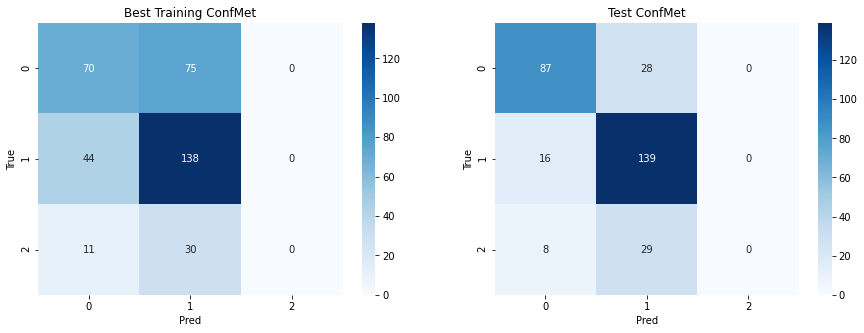

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.50s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.079932,1.049312,0.424242,0.480978
1,1.030640,1.026229,0.510490,0.494565
2,1.021244,1.019798,0.510490,0.491848
3,1.019035,1.004458,0.513986,0.494565
4,1.014622,1.011126,0.505828,0.494565
5,1.011924,1.000473,0.508159,0.494565
6,1.005688,0.996374,0.508159,0.497283
7,1.008925,0.994939,0.498834,0.502717
8,1.007551,1.026732,0.495338,0.494565
9,0.992835,0.982882,0.529138,0.557065



Training complete in 5m 15s
Best val Acc: 0.600543


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6005434782608695


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.36it/s]



Test Accuracy : 0.7427 

Test Loss : 0.7945 



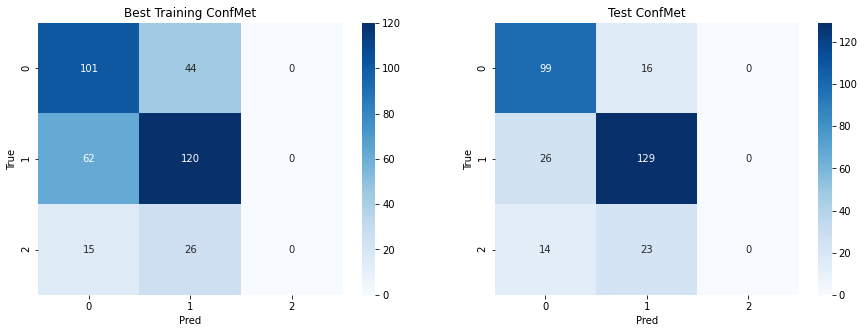

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.086651,1.069185,0.385781,0.453804
1,1.029421,1.014466,0.504662,0.486413
2,1.016291,1.052431,0.509324,0.494565
3,1.014450,1.006441,0.515152,0.494565
4,1.010460,1.012038,0.509324,0.491848
5,1.012897,1.040552,0.510490,0.494565
6,1.000337,1.035113,0.513986,0.494565
7,0.995957,0.991264,0.531469,0.519022
8,0.984649,1.018248,0.544289,0.486413
9,0.952656,1.015205,0.590909,0.510870



Training complete in 5m 14s
Best val Acc: 0.597826


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5978260869565217


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.20it/s]



Test Accuracy : 0.7622 

Test Loss : 0.7948 



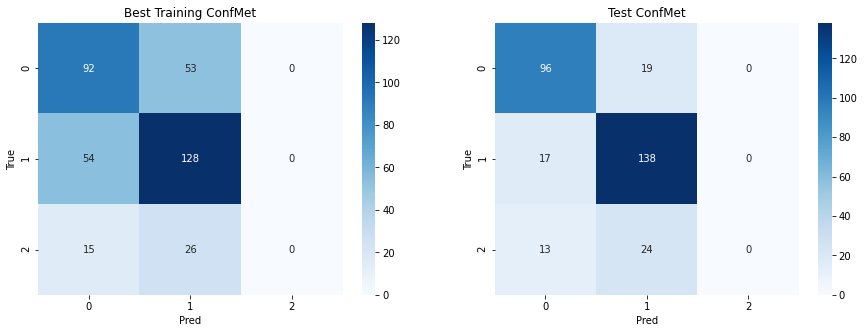

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:12<00:00, 10.43s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.088521,1.042795,0.386946,0.459239
1,1.025174,1.015722,0.503497,0.491848
2,1.015081,1.013490,0.503497,0.494565
3,1.011807,1.005072,0.506993,0.494565
4,1.010566,1.004608,0.510490,0.480978
5,1.014472,1.010462,0.508159,0.494565
6,1.003449,1.006132,0.518648,0.494565
7,0.997404,0.990030,0.524476,0.491848
8,0.966809,1.032343,0.574592,0.500000
9,0.967939,0.995529,0.571096,0.521739



Training complete in 5m 13s
Best val Acc: 0.605978


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6059782608695652


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.11it/s]



Test Accuracy : 0.7459 

Test Loss : 0.8052 



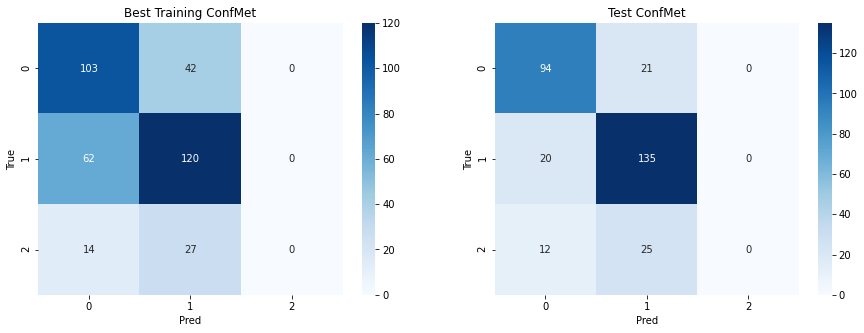

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.076555,1.052615,0.405594,0.491848
1,1.022438,1.020438,0.512821,0.502717
2,1.019831,1.012452,0.503497,0.494565
3,1.021921,1.012313,0.502331,0.494565
4,1.013110,1.011328,0.510490,0.513587
5,1.019139,1.014528,0.495338,0.491848
6,1.014649,1.012582,0.495338,0.494565
7,1.000901,0.991756,0.522145,0.527174
8,0.985112,1.003532,0.536131,0.519022
9,0.980142,1.007390,0.546620,0.502717



Training complete in 5m 15s
Best val Acc: 0.586957


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5869565217391305


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.54it/s]



Test Accuracy : 0.7915 

Test Loss : 0.7629 



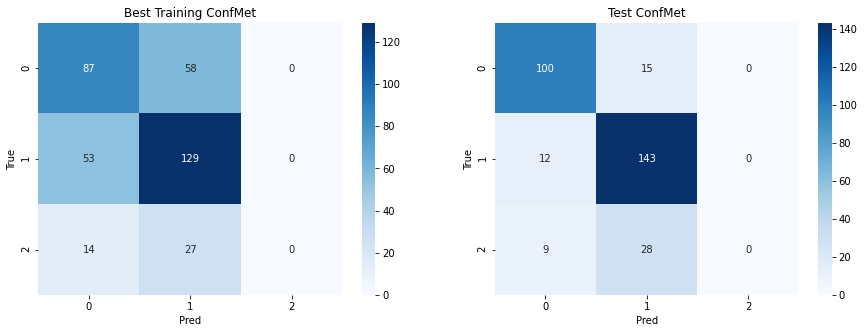

In [36]:
simclr_acc, simclr_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                test_dataloader,
                                                                                                downstram_cls_len,
                                                                                                pretrained_arch = False,
                                                                                                mode = 'simclr',
                                                                                                learner_path = 'simclrv1_trained_model_filtered.pth')

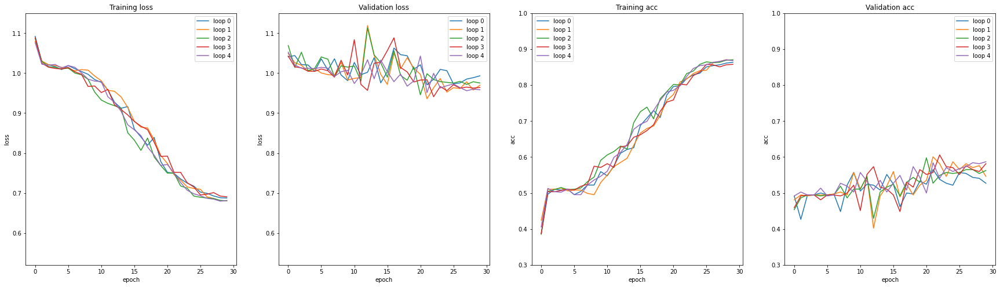

In [37]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [38]:
df_res_simclr = pd.DataFrame({'simclr_acc':simclr_acc,'simclr_loss':simclr_loss})
df_res_simclr.to_csv(path_result/'df_res_simclr_pretrained_pretext.csv')

---

---

>> #### Grad-CAM Evaluation

In [39]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  64
positive case :  243


In [40]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}


Grad-CAM : simclr (negative): 100%|██████████| 64/64 [01:26<00:00,  1.35s/it]


Grad-CAM : simclr (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  simclr_dwnstrm_model.pth


Grad-CAM : simclr (positive): 100%|██████████| 5/5 [00:07<00:00,  1.58s/it]


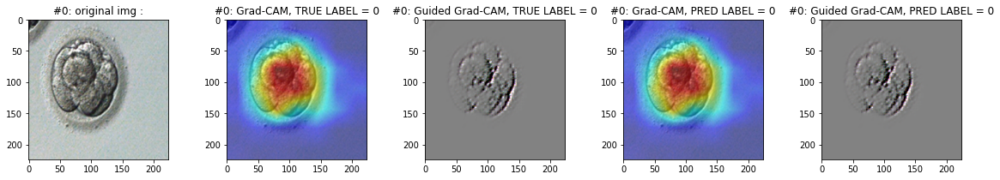

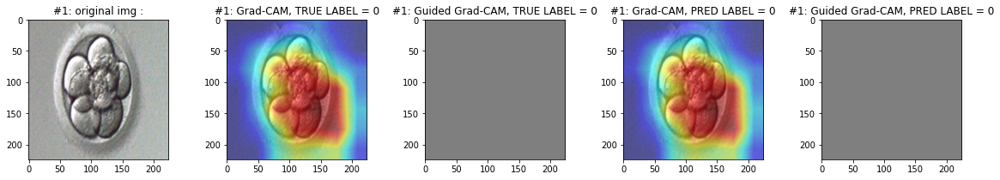

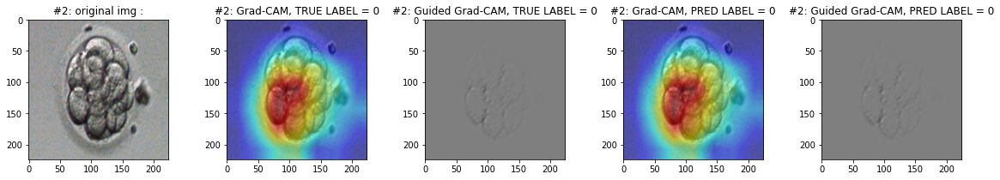

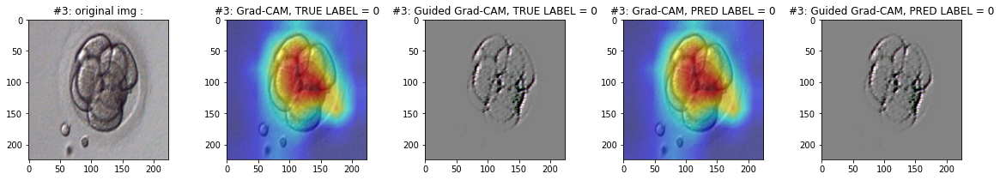

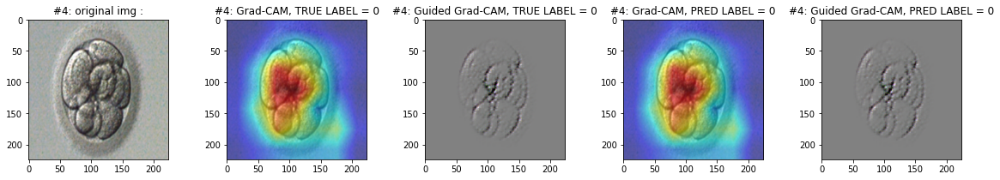

In [41]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr",
                 case = "positive",
                 display_res = True)

In [42]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr",
                 case = "negative",
                 display_res = True)

Output hidden; open in https://colab.research.google.com to view.

> ### **Rotation**

>> #### Training the model

In [43]:
filtered_model = torch.load(path_models/'pretext/rotation_trained_model.pth')
# print(len(filtered_model))
filtered_model.pop('fc.3.weight')
filtered_model.pop('fc.3.bias')
# print(len(filtered_model))
torch.save(filtered_model, 
           path_models/'rotation_trained_model_filtered.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.47s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.071275,1.005644,0.459207,0.565217
1,0.924697,0.921245,0.655012,0.619565
2,0.809375,0.909441,0.750583,0.630435
3,0.676647,0.885025,0.902098,0.657609
4,0.636396,0.914436,0.927739,0.635870
5,0.646171,0.951249,0.917249,0.581522
6,0.652302,0.922545,0.912587,0.603261
7,0.684216,0.968242,0.861305,0.562500
8,0.650321,0.877739,0.904429,0.652174
9,0.629749,0.971947,0.923077,0.565217



Training complete in 5m 14s
Best val Acc: 0.728261


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7282608695652174


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.50it/s]



Test Accuracy : 0.9121 

Test Loss : 0.6407 



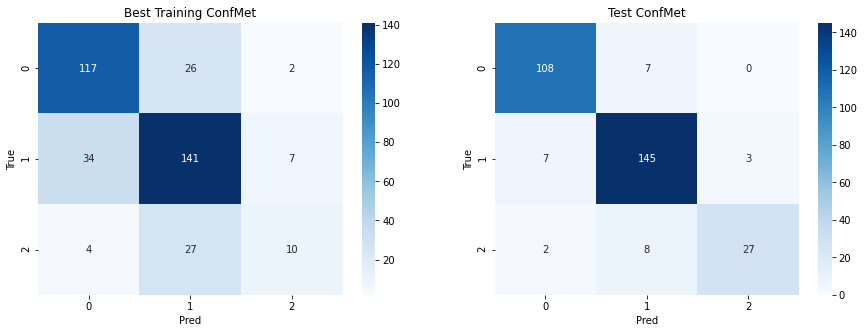

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.044715,0.994630,0.515152,0.559783
1,0.925053,0.911309,0.645688,0.644022
2,0.803573,0.891871,0.772727,0.671196
3,0.700157,0.890739,0.858974,0.657609
4,0.641647,0.978057,0.933566,0.546196
5,0.643117,0.870503,0.919580,0.668478
6,0.632222,0.886523,0.930070,0.644022
7,0.643487,1.044469,0.916084,0.478261
8,0.657442,0.932458,0.899767,0.592391
9,0.649928,0.889260,0.903263,0.646739



Training complete in 5m 15s
Best val Acc: 0.730978


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7309782608695652


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.14it/s]



Test Accuracy : 0.9055 

Test Loss : 0.6429 



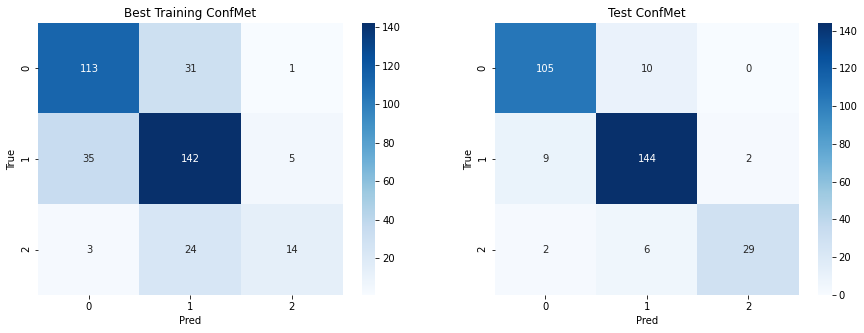

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.46s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.059862,1.015440,0.440559,0.543478
1,0.934112,0.940012,0.644522,0.622283
2,0.803455,0.911504,0.778555,0.652174
3,0.666877,0.923230,0.910256,0.630435
4,0.634474,0.882069,0.928904,0.660326
5,0.641003,0.920237,0.924242,0.622283
6,0.642657,0.930085,0.923077,0.595109
7,0.662308,1.011629,0.892774,0.535326
8,0.652581,0.869625,0.897436,0.665761
9,0.630632,0.952884,0.924242,0.589674



Training complete in 5m 14s
Best val Acc: 0.687500


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6875


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.37it/s]



Test Accuracy : 0.8958 

Test Loss : 0.6535 



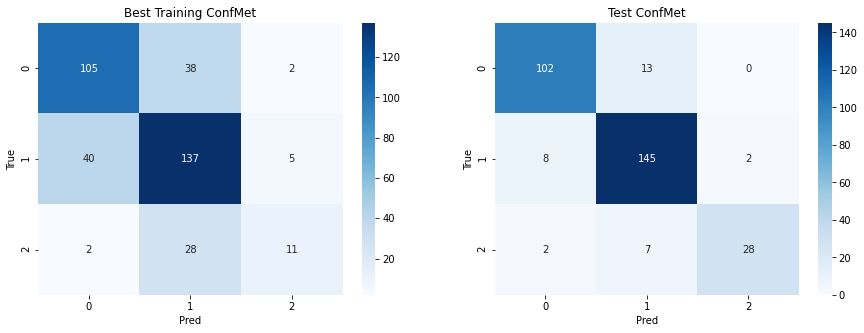

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.45s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.104560,1.037814,0.344988,0.532609
1,0.944420,0.926489,0.637529,0.638587
2,0.809111,0.915427,0.752914,0.644022
3,0.685536,0.889694,0.893939,0.654891
4,0.639590,0.914116,0.934732,0.614130
5,0.638401,0.903058,0.923077,0.644022
6,0.641899,0.908974,0.919580,0.635870
7,0.657875,0.884243,0.898601,0.649457
8,0.657960,0.869547,0.902098,0.665761
9,0.635431,0.887044,0.921911,0.654891



Training complete in 5m 14s
Best val Acc: 0.722826


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7228260869565217


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.81it/s]



Test Accuracy : 0.9218 

Test Loss : 0.6273 



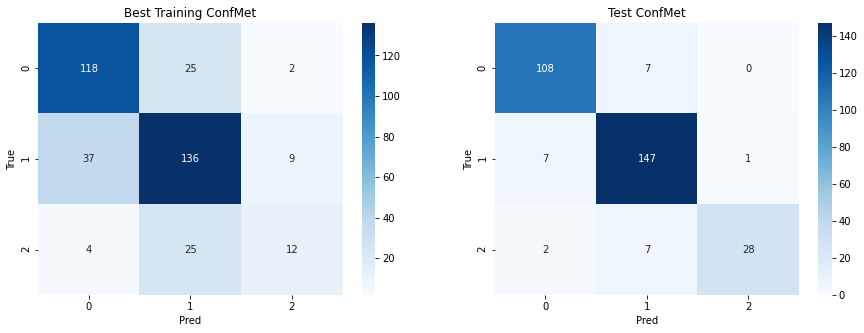

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.44s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.054903,1.009422,0.482517,0.505435
1,0.940245,0.939596,0.628205,0.616848
2,0.827693,0.906043,0.744755,0.644022
3,0.713085,0.915978,0.842657,0.633152
4,0.649890,0.917470,0.919580,0.616848
5,0.632058,0.884081,0.932401,0.649457
6,0.627257,0.913830,0.938228,0.608696
7,0.630323,0.934977,0.928904,0.597826
8,0.632712,0.972344,0.925408,0.554348
9,0.619133,0.913828,0.937063,0.616848



Training complete in 5m 13s
Best val Acc: 0.706522


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7065217391304348


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.12it/s]



Test Accuracy : 0.9121 

Test Loss : 0.6435 



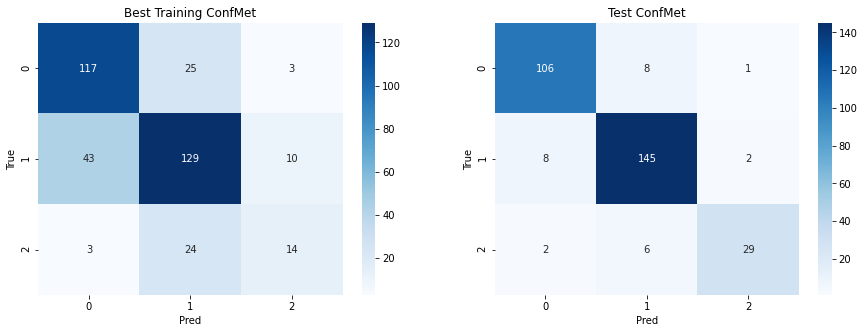

In [44]:
rotation_acc, rotation_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                    test_dataloader,
                                                                                                    downstram_cls_len,
                                                                                                    pretrained_arch = False,
                                                                                                    mode = 'rot',
                                                                                                    learner_path = 'rotation_trained_model_filtered.pth')

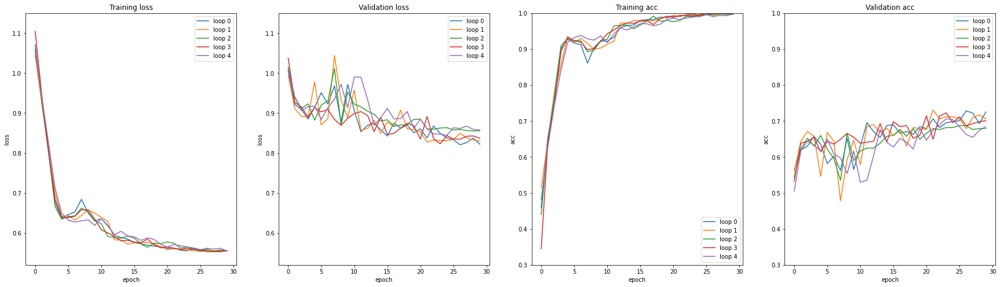

In [45]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [46]:
df_res_rotation = pd.DataFrame({'rotation_acc':rotation_acc, 'rotation_loss':rotation_loss})
df_res_rotation.to_csv(path_result/'df_res_rotation_pretrained_pretext.csv')

---

---

>> #### Grad-CAM Evaluation

In [47]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  24
positive case :  283


In [48]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : rotation (negative): 100%|██████████| 24/24 [00:32<00:00,  1.34s/it]


Grad-CAM : rotation (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  rot_dwnstrm_model.pth


Grad-CAM : rotation (positive): 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]


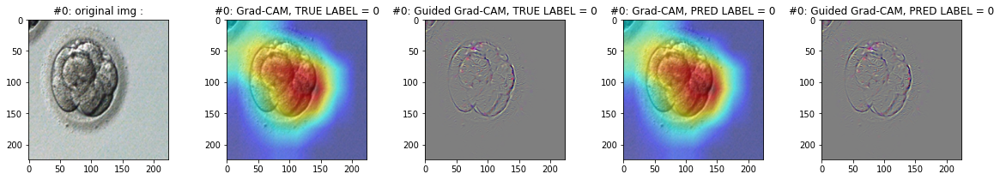

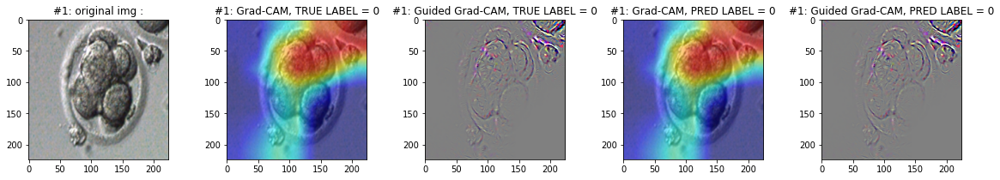

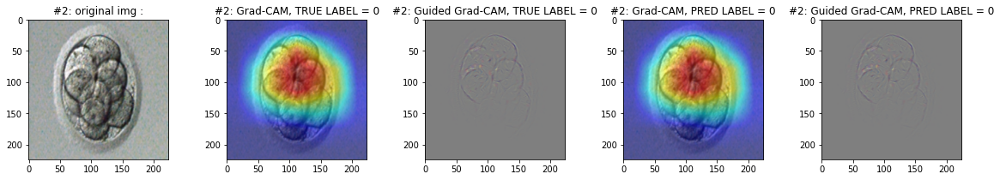

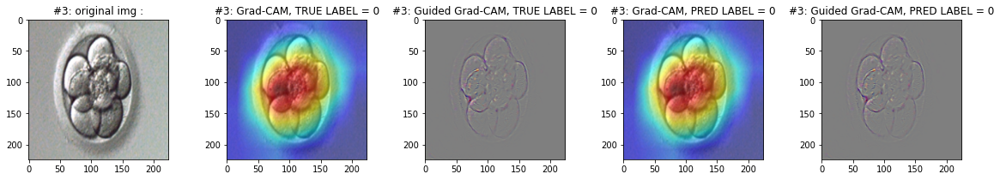

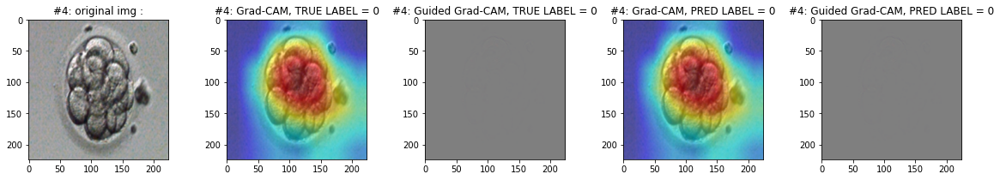

In [49]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation",
                 case = "positive")

In [50]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

> ### **Jigsaw**

>>#### Training the model

In [51]:
filtered_model = torch.load(path_models/'pretext/jigsaw_trained_model.pth')
# print(len(filtered_model))
filtered_model.pop('fc.3.weight')
filtered_model.pop('fc.3.bias')
# print(len(filtered_model))
torch.save(filtered_model, 
           path_models/'jigsaw_trained_model_filtered.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.47s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.053589,1.022328,0.489510,0.540761
1,0.910066,0.933831,0.679487,0.616848
2,0.770181,0.919800,0.812354,0.619565
3,0.670982,0.904112,0.905594,0.635870
4,0.637832,0.893691,0.924242,0.649457
5,0.652328,0.894981,0.911422,0.635870
6,0.659173,0.908992,0.900932,0.638587
7,0.669181,0.913281,0.888112,0.614130
8,0.698132,0.947606,0.848485,0.578804
9,0.662320,0.870118,0.891608,0.663043



Training complete in 5m 14s
Best val Acc: 0.698370


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6983695652173914


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.52it/s]



Test Accuracy : 0.9186 

Test Loss : 0.6355 



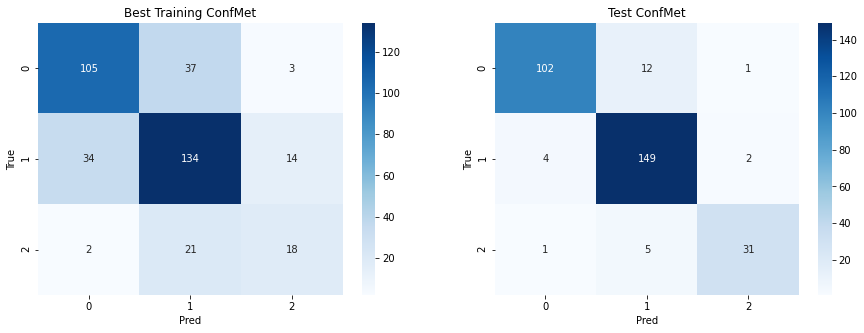

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.053838,1.005211,0.458042,0.559783
1,0.916020,0.926472,0.667832,0.652174
2,0.781258,0.911081,0.786713,0.635870
3,0.679736,0.905503,0.892774,0.630435
4,0.633500,0.919613,0.938228,0.614130
5,0.655528,0.923922,0.907925,0.619565
6,0.702863,1.070963,0.856643,0.442935
7,0.688697,0.911426,0.863636,0.630435
8,0.655917,0.882068,0.903263,0.663043
9,0.660905,0.923308,0.892774,0.600543



Training complete in 5m 15s
Best val Acc: 0.690217


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6902173913043478


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.69it/s]



Test Accuracy : 0.8990 

Test Loss : 0.6550 



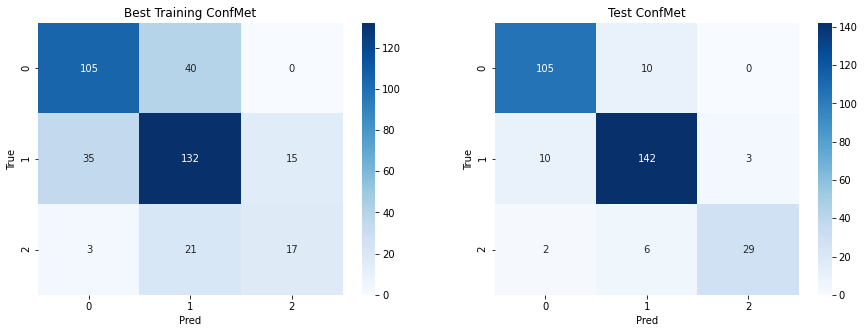

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.084253,1.017652,0.400932,0.567935
1,0.907561,0.928763,0.673660,0.625000
2,0.756102,0.897871,0.824009,0.646739
3,0.646809,0.931773,0.931235,0.597826
4,0.625891,0.917452,0.949883,0.622283
5,0.627221,0.892189,0.932401,0.649457
6,0.653273,0.936011,0.900932,0.611413
7,0.671829,0.966641,0.872960,0.565217
8,0.670329,1.105242,0.883450,0.394022
9,0.653318,0.912827,0.895105,0.625000



Training complete in 5m 15s
Best val Acc: 0.679348


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6793478260869565


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.72it/s]



Test Accuracy : 0.9121 

Test Loss : 0.6382 



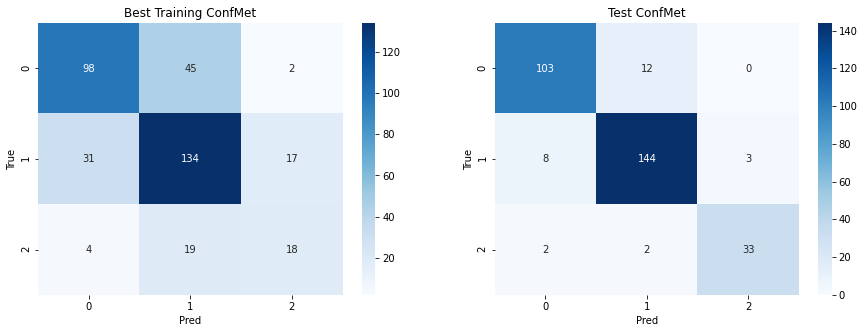

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.094825,1.026141,0.353147,0.519022
1,0.930231,0.944268,0.644522,0.627717
2,0.778539,0.911234,0.800699,0.633152
3,0.654223,0.886846,0.926573,0.657609
4,0.628991,0.934496,0.934732,0.584239
5,0.639174,0.894929,0.925408,0.646739
6,0.653080,0.995856,0.902098,0.551630
7,0.702940,1.038794,0.842657,0.502717
8,0.690757,1.014710,0.853147,0.519022
9,0.656742,0.913164,0.892774,0.603261



Training complete in 5m 15s
Best val Acc: 0.676630


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6766304347826086


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.71it/s]



Test Accuracy : 0.8925 

Test Loss : 0.6492 



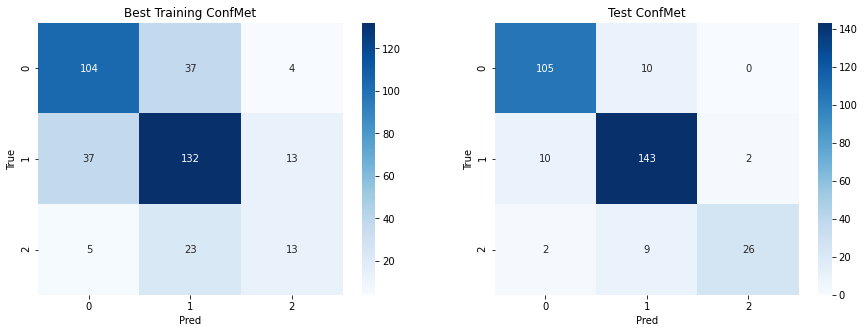

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.048653,1.004663,0.497669,0.603261
1,0.902428,0.929836,0.677156,0.633152
2,0.762778,0.914293,0.810023,0.638587
3,0.666190,0.887681,0.904429,0.641304
4,0.631794,0.973214,0.941725,0.559783
5,0.656992,0.911520,0.909091,0.625000
6,0.683202,0.956201,0.867133,0.581522
7,0.676656,0.981854,0.875291,0.562500
8,0.668158,0.983382,0.884615,0.540761
9,0.653923,0.899004,0.898601,0.641304



Training complete in 5m 15s
Best val Acc: 0.690217


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6902173913043478


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.79it/s]



Test Accuracy : 0.9218 

Test Loss : 0.6293 



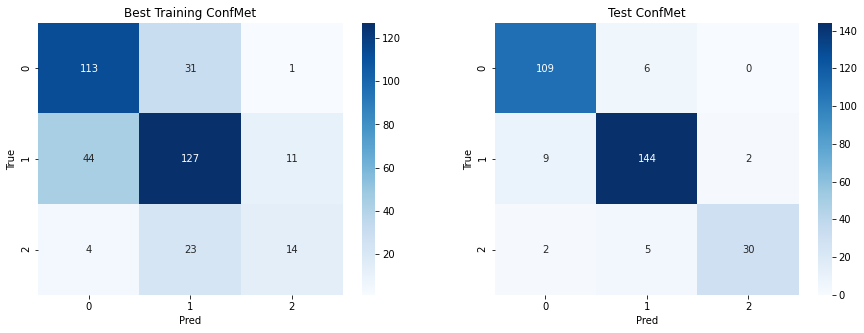

In [52]:
jigsaw_acc, jigsaw_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                test_dataloader,
                                                                                                downstram_cls_len,
                                                                                                pretrained_arch = False,
                                                                                                mode = 'jig',
                                                                                                learner_path = 'jigsaw_trained_model_filtered.pth')


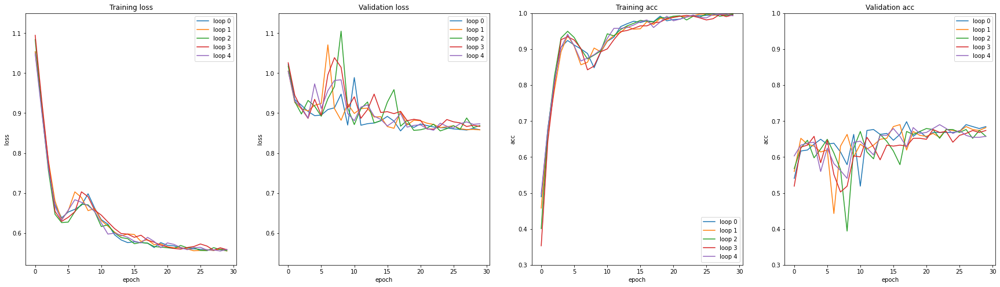

In [53]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [54]:
df_res_jigsaw = pd.DataFrame({'jigsaw_acc':jigsaw_acc, 'jigsaw_loss':jigsaw_loss})
df_res_jigsaw.to_csv(path_result/'df_res_jigsaw_pretrained_pretext.csv')

>> #### Grad-CAM Evaluation

In [55]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  24
positive case :  283


In [56]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : jigsaw (negative): 100%|██████████| 24/24 [00:32<00:00,  1.35s/it]


Grad-CAM : jigsaw (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  jig_dwnstrm_model.pth


Grad-CAM : jigsaw (positive): 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]


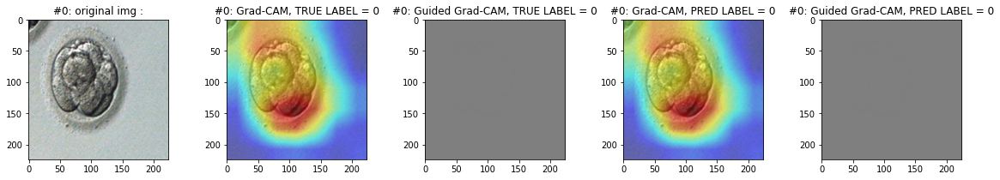

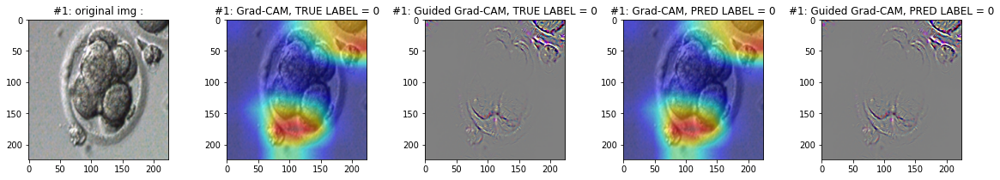

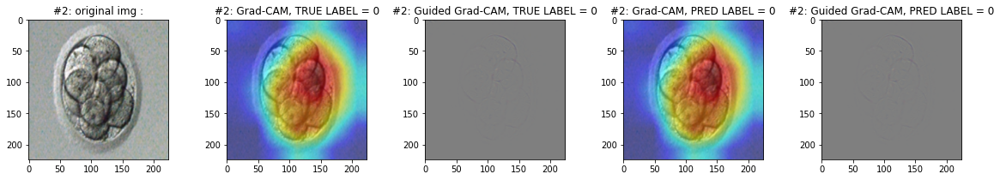

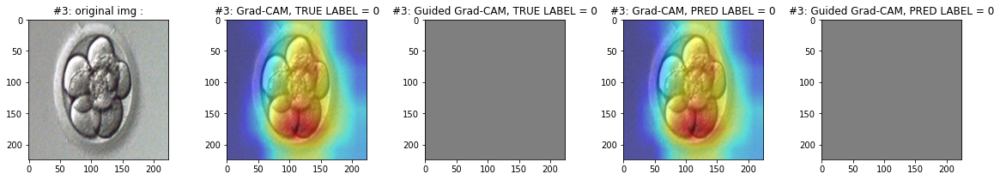

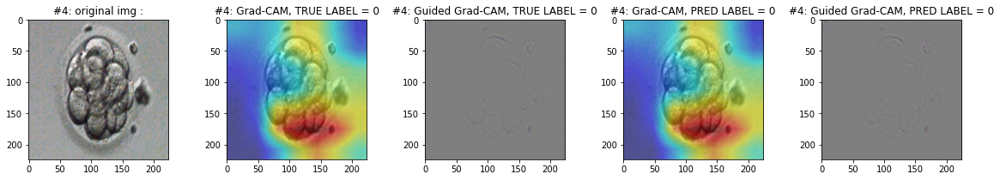

In [57]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw",
                 case = "positive")

In [58]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

## **Downstream Task Training for pretrained pretext = False**

> ### **SimCLR v1**

>> #### Training the model

In [59]:
filtered_model = torch.load(path_models/'pretext/simclrv1_trained_model_nopretrained.pth')
torch.save(filtered_model, 
           path_models/'simclrv1_trained_model_filtered_nopretrainedpretext.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.083255,1.035435,0.420746,0.494565
1,1.026856,1.020981,0.510490,0.500000
2,1.014457,1.013426,0.503497,0.494565
3,1.012177,0.996892,0.508159,0.508152
4,1.014680,0.999807,0.504662,0.510870
5,1.011559,1.009319,0.505828,0.491848
6,1.003524,1.005152,0.503497,0.508152
7,1.002423,1.035787,0.508159,0.440217
8,0.990975,1.030100,0.527972,0.500000
9,0.987816,0.970236,0.539627,0.581522



Training complete in 5m 14s
Best val Acc: 0.600543


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6005434782608695


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.45it/s]



Test Accuracy : 0.7818 

Test Loss : 0.7717 



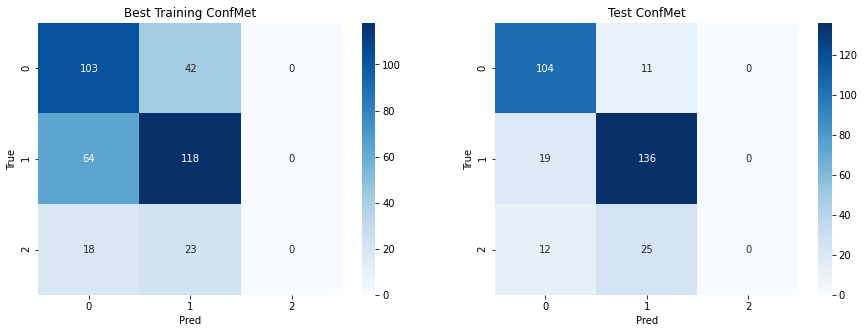

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.50s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.072019,1.060980,0.437063,0.483696
1,1.028445,1.028479,0.491841,0.494565
2,1.017271,1.020922,0.509324,0.494565
3,1.016169,1.035558,0.509324,0.494565
4,1.018588,0.997081,0.491841,0.497283
5,1.009944,1.005119,0.516317,0.508152
6,1.009889,0.995999,0.518648,0.546196
7,0.988568,1.080757,0.530303,0.453804
8,0.971467,1.091775,0.555944,0.432065
9,0.952714,0.995980,0.583916,0.524457



Training complete in 5m 15s
Best val Acc: 0.570652


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5706521739130435


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.99it/s]



Test Accuracy : 0.7590 

Test Loss : 0.7821 



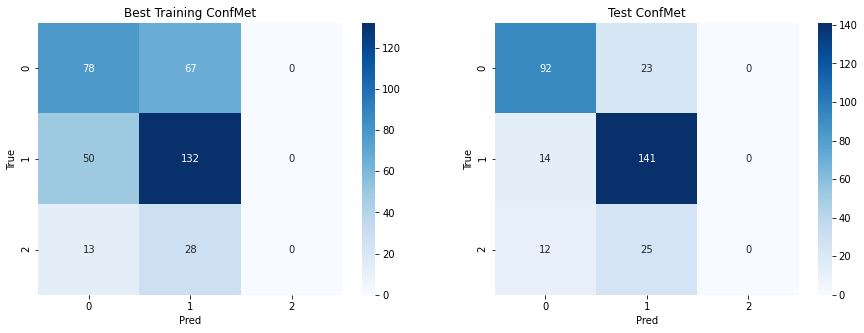

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.53s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.068812,1.061596,0.468531,0.483696
1,1.025939,1.038182,0.510490,0.494565
2,1.019356,1.013251,0.506993,0.494565
3,1.013589,1.028774,0.513986,0.494565
4,1.011229,1.002239,0.502331,0.491848
5,1.009485,1.004763,0.504662,0.494565
6,1.001662,0.997424,0.518648,0.497283
7,0.992659,0.988758,0.533800,0.513587
8,0.990417,1.004792,0.557110,0.505435
9,0.958768,1.037286,0.576923,0.497283



Training complete in 5m 16s
Best val Acc: 0.576087


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5760869565217391


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.21it/s]



Test Accuracy : 0.7427 

Test Loss : 0.8001 



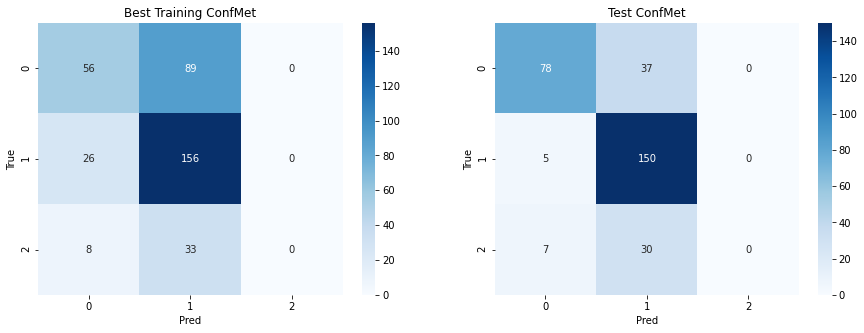

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.51s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.096732,1.046345,0.374126,0.486413
1,1.029871,1.015113,0.502331,0.502717
2,1.022750,1.016620,0.510490,0.494565
3,1.015307,1.043804,0.509324,0.494565
4,1.018987,1.023643,0.505828,0.448370
5,1.014682,1.020999,0.500000,0.491848
6,1.006966,1.002515,0.506993,0.491848
7,1.003283,1.030567,0.513986,0.494565
8,0.992050,1.002002,0.546620,0.519022
9,0.971868,0.974434,0.572261,0.532609



Training complete in 5m 15s
Best val Acc: 0.592391


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.592391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.66it/s]



Test Accuracy : 0.7166 

Test Loss : 0.8235 



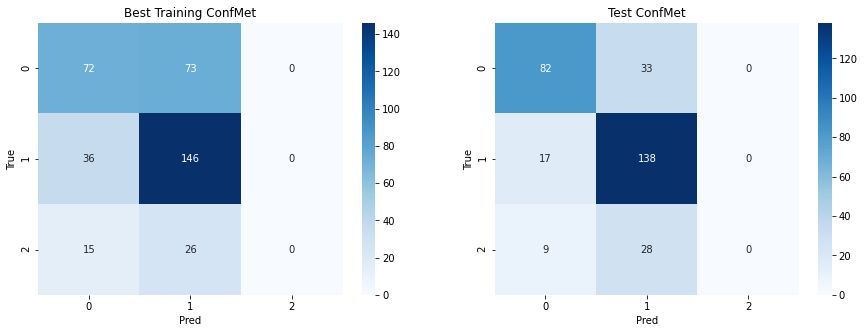

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:16<00:00, 10.56s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.071393,1.032747,0.430070,0.494565
1,1.026582,1.019321,0.511655,0.500000
2,1.013468,1.015804,0.510490,0.494565
3,1.012096,1.021255,0.506993,0.494565
4,1.016920,1.008904,0.511655,0.494565
5,1.013059,1.042082,0.501166,0.494565
6,1.014232,1.007917,0.511655,0.494565
7,1.002918,1.002285,0.512821,0.489130
8,0.997809,0.994601,0.526807,0.500000
9,0.997569,1.022992,0.531469,0.497283



Training complete in 5m 17s
Best val Acc: 0.600543


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6005434782608695


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.00it/s]



Test Accuracy : 0.7915 

Test Loss : 0.7650 



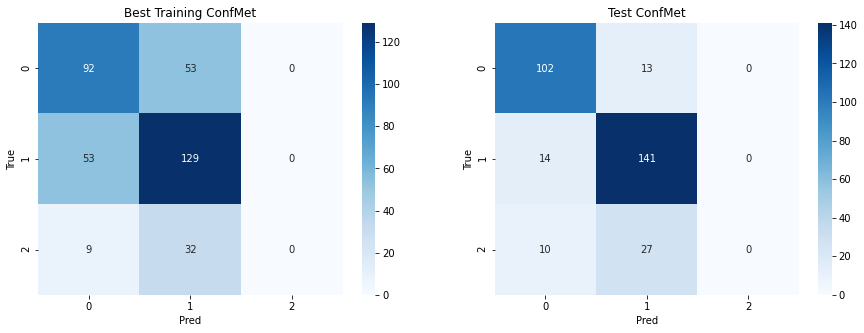

In [60]:
simclr_acc, simclr_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                test_dataloader,
                                                                                                downstram_cls_len,
                                                                                                pretrained_arch = False,
                                                                                                mode = 'simclr_noimagenet',
                                                                                                learner_path = 'simclrv1_trained_model_filtered_nopretrainedpretext.pth')

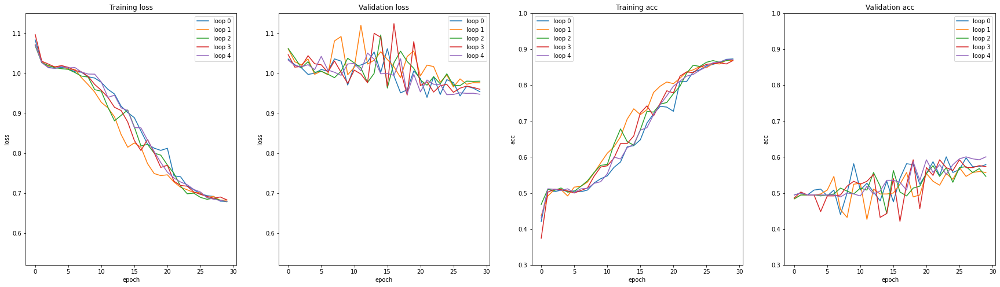

In [61]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [62]:
df_res_simclr = pd.DataFrame({'simclr_acc_notpretrained_pretext':simclr_acc, 'simclr_loss_notpretrained_pretext':simclr_loss})
df_res_simclr.to_csv(path_result/'df_res_simclr_notpretrained_pretext.csv')

---

---

>> #### Grad-CAM Evaluation

In [63]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  64
positive case :  243


In [64]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr_np",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr_np",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : simclr_np (negative): 100%|██████████| 64/64 [01:26<00:00,  1.36s/it]


Grad-CAM : simclr_np (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  simclr_noimagenet_dwnstrm_model.pth


Grad-CAM : simclr_np (positive): 100%|██████████| 5/5 [00:07<00:00,  1.57s/it]


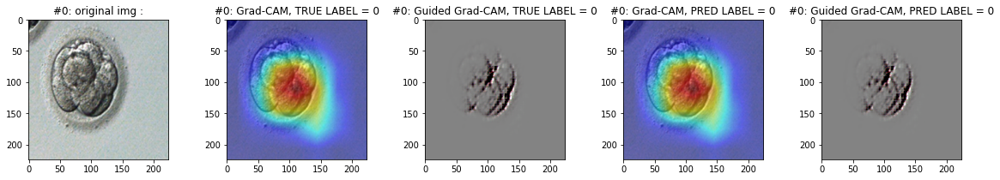

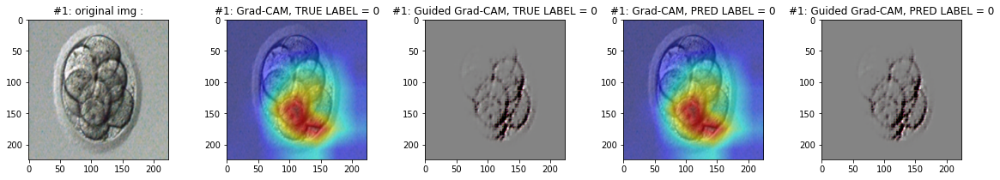

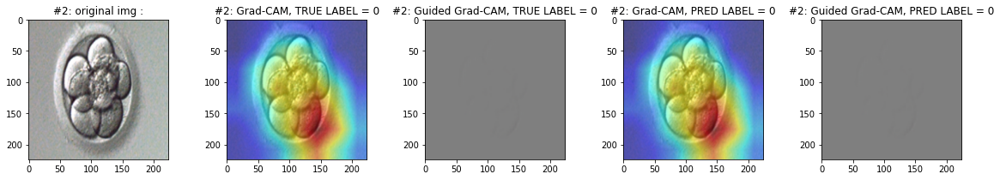

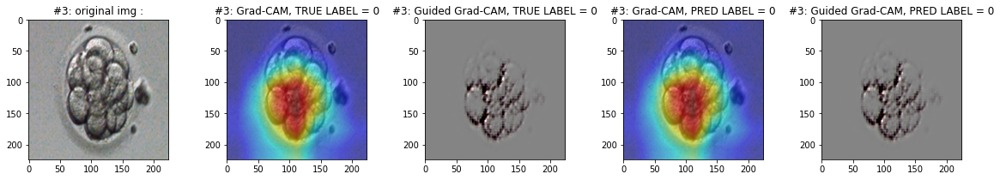

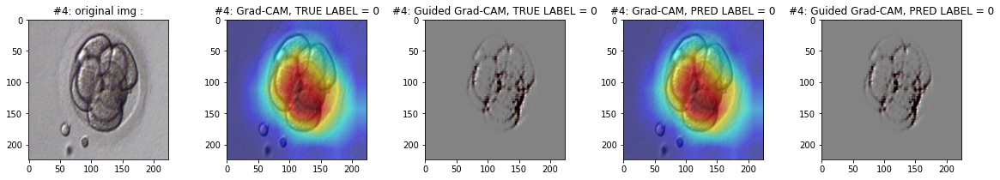

In [65]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr_np",
                 case = "positive")

In [66]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "simclr_np",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

> ### **Rotation**

>> #### Training the model

In [67]:
filtered_model = torch.load(path_models/'pretext/rotation_trained_model_nopretrained.pth')
# print(len(filtered_model))
filtered_model.pop('fc.3.weight')
filtered_model.pop('fc.3.bias')
# print(len(filtered_model))
torch.save(filtered_model, 
           path_models/'rotation_trained_model_filtered_nopretrainedpretext.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.054269,1.016291,0.467366,0.491848
1,0.974009,0.980471,0.580420,0.578804
2,0.918318,0.955517,0.659674,0.605978
3,0.868888,1.032244,0.703963,0.500000
4,0.826886,1.013904,0.735431,0.519022
5,0.845017,0.989530,0.706294,0.551630
6,0.877539,0.985786,0.667832,0.546196
7,0.860571,1.052754,0.687646,0.497283
8,0.851328,0.978807,0.688811,0.543478
9,0.808490,1.011615,0.738928,0.524457



Training complete in 5m 15s
Best val Acc: 0.616848


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6168478260869565


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.99it/s]



Test Accuracy : 0.7655 

Test Loss : 0.7824 



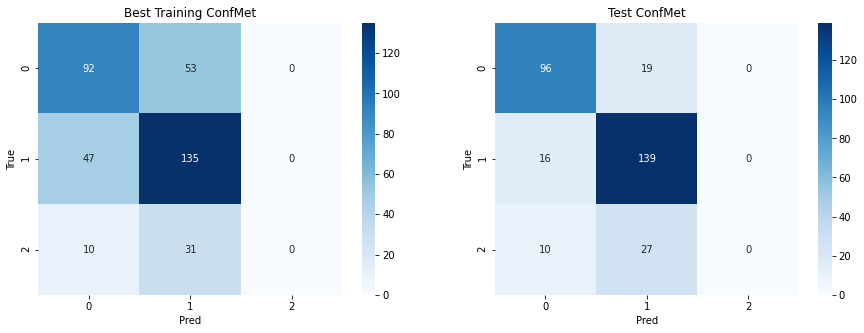

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.53s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.078354,1.035593,0.413753,0.500000
1,0.980290,0.987394,0.565268,0.548913
2,0.915910,0.961699,0.656177,0.581522
3,0.865341,0.953226,0.716783,0.570652
4,0.856496,0.984689,0.709790,0.546196
5,0.873488,1.100729,0.671329,0.429348
6,0.882418,0.982348,0.652681,0.535326
7,0.846088,1.056006,0.701632,0.494565
8,0.845764,0.985798,0.692308,0.554348
9,0.829667,0.990440,0.708625,0.540761



Training complete in 5m 16s
Best val Acc: 0.603261


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6032608695652174


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.02it/s]



Test Accuracy : 0.7362 

Test Loss : 0.8215 



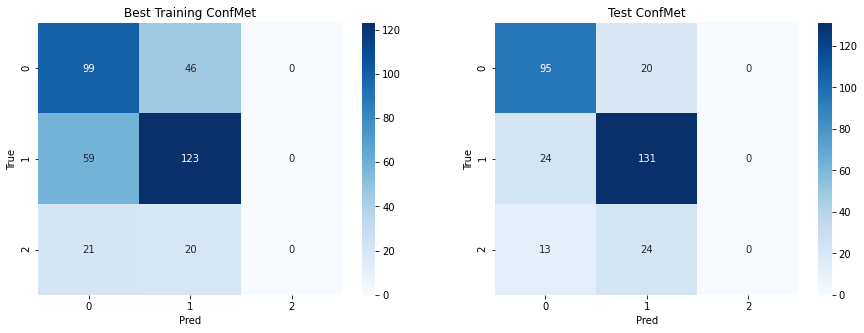

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.52s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.052076,1.028185,0.500000,0.497283
1,0.973787,0.993632,0.560606,0.565217
2,0.916603,0.964906,0.645688,0.584239
3,0.848769,1.117660,0.731935,0.399457
4,0.821591,0.984157,0.749417,0.546196
5,0.879739,1.056358,0.670163,0.494565
6,0.887258,0.964569,0.664336,0.576087
7,0.833957,1.057301,0.713287,0.491848
8,0.822382,1.042270,0.726107,0.497283
9,0.822541,1.156302,0.719114,0.394022



Training complete in 5m 16s
Best val Acc: 0.611413


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6114130434782609


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.13it/s]



Test Accuracy : 0.7720 

Test Loss : 0.7749 



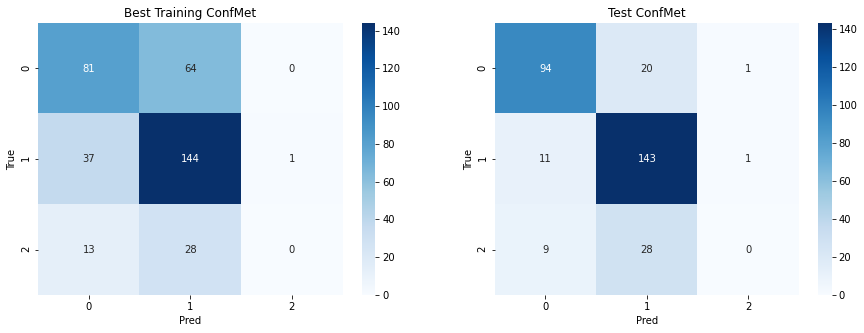

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.070823,1.029163,0.428904,0.500000
1,0.979099,0.978649,0.567599,0.570652
2,0.916600,0.963296,0.649184,0.578804
3,0.861698,0.967405,0.713287,0.565217
4,0.854919,1.008851,0.707459,0.524457
5,0.853501,1.056960,0.699301,0.478261
6,0.857639,0.980858,0.688811,0.548913
7,0.848970,1.021746,0.703963,0.516304
8,0.826564,0.985229,0.722611,0.554348
9,0.811667,1.035261,0.733100,0.497283



Training complete in 5m 14s
Best val Acc: 0.622283


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6222826086956522


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.99it/s]



Test Accuracy : 0.8404 

Test Loss : 0.6975 



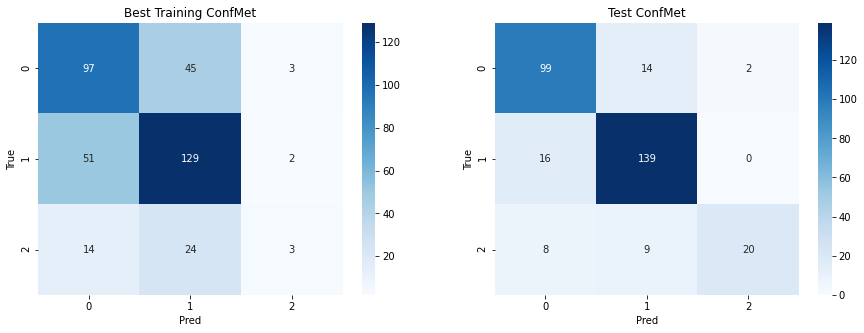

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:16<00:00, 10.56s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.046903,1.010331,0.480186,0.510870
1,0.968798,0.990988,0.589744,0.527174
2,0.905231,0.978134,0.658508,0.562500
3,0.846217,1.044647,0.737762,0.494565
4,0.850516,0.997640,0.705128,0.524457
5,0.853495,1.053919,0.696970,0.494565
6,0.865015,1.154656,0.686480,0.396739
7,0.876206,1.152684,0.663170,0.396739
8,0.872331,0.968618,0.663170,0.576087
9,0.826503,1.027115,0.720280,0.516304



Training complete in 5m 17s
Best val Acc: 0.595109


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.595108695652174


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.47it/s]



Test Accuracy : 0.7622 

Test Loss : 0.7723 



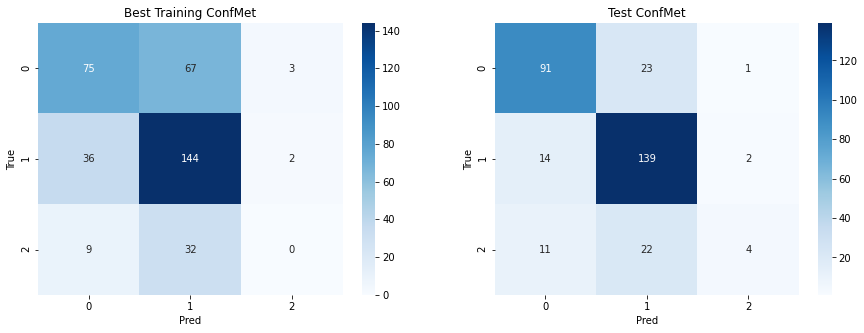

In [68]:
rotation_acc, rotation_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                    test_dataloader,
                                                                                                    downstram_cls_len,
                                                                                                    pretrained_arch = False,
                                                                                                    mode = 'rot_noimagenet',
                                                                                                    learner_path = 'rotation_trained_model_filtered_nopretrainedpretext.pth')

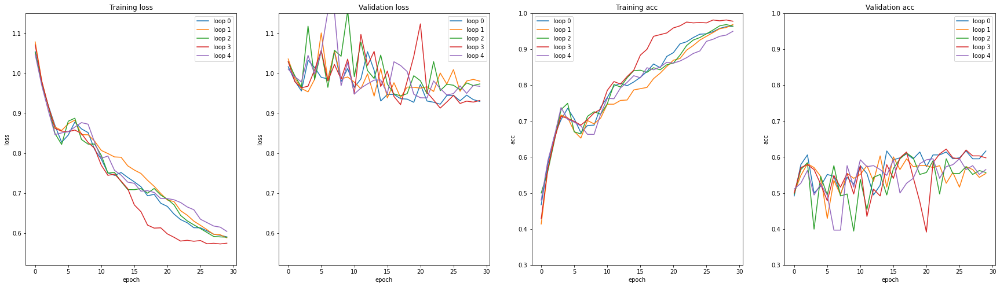

In [69]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [70]:
df_res_rotation = pd.DataFrame({'rotation_acc_notpretrained_pretext':rotation_acc, 'rotation_loss_notpretrained_pretext':rotation_loss})
df_res_rotation.to_csv(path_result/'df_res_rotation_notpretrained_pretext.csv')

---

---

>> #### Grad-CAM Evaluation

In [71]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  49
positive case :  258


In [72]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation_np",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation_np",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : rotation_np (negative): 100%|██████████| 49/49 [01:06<00:00,  1.37s/it]


Grad-CAM : rotation_np (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  rot_noimagenet_dwnstrm_model.pth


Grad-CAM : rotation_np (positive): 100%|██████████| 5/5 [00:08<00:00,  1.60s/it]


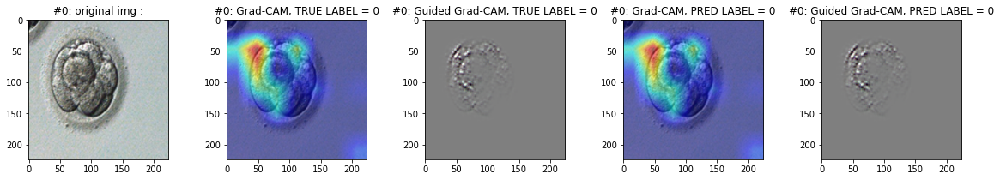

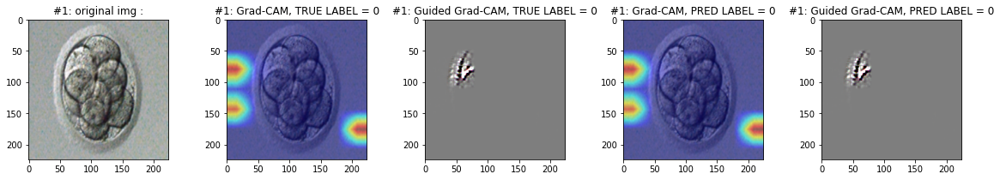

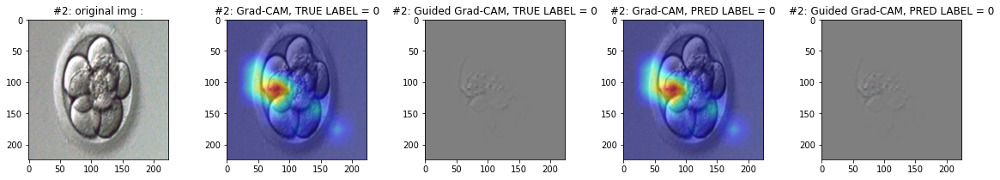

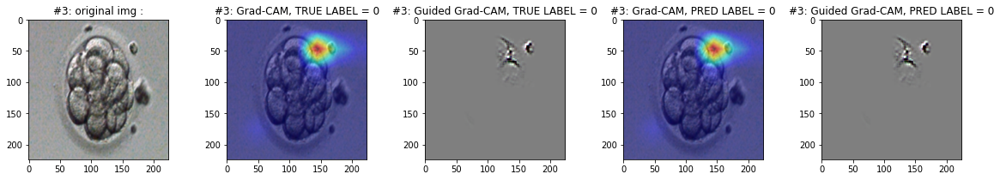

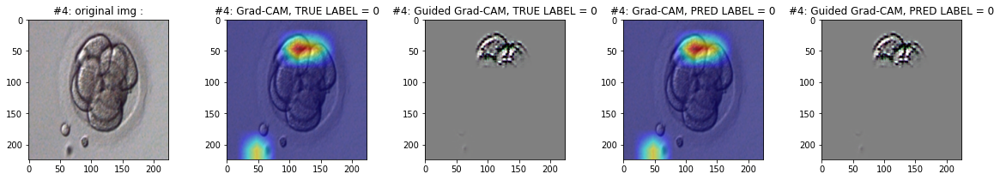

In [73]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation_np",
                 case = "positive")

In [74]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "rotation_np",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

> ### **Jigsaw**

>>#### Training the model

In [75]:
filtered_model = torch.load(path_models/'pretext/jigsaw_trained_model_nopretrained.pth')
# print(len(filtered_model))
filtered_model.pop('fc.3.weight')
filtered_model.pop('fc.3.bias')
# print(len(filtered_model))
torch.save(filtered_model, 
           path_models/'jigsaw_trained_model_filtered_nopretrainedpretext.pth')

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.50s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.074412,1.033063,0.423077,0.508152
1,0.964890,0.995186,0.592075,0.524457
2,0.886756,1.026174,0.695804,0.478261
3,0.805706,1.027003,0.779720,0.464674
4,0.806445,1.005862,0.757576,0.513587
5,0.876927,1.124528,0.670163,0.418478
6,0.893470,1.002621,0.638695,0.540761
7,0.866234,1.049832,0.680653,0.500000
8,0.844738,1.053649,0.695804,0.497283
9,0.822589,0.965952,0.719114,0.578804



Training complete in 5m 15s
Best val Acc: 0.592391


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.592391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.14it/s]



Test Accuracy : 0.7785 

Test Loss : 0.7682 



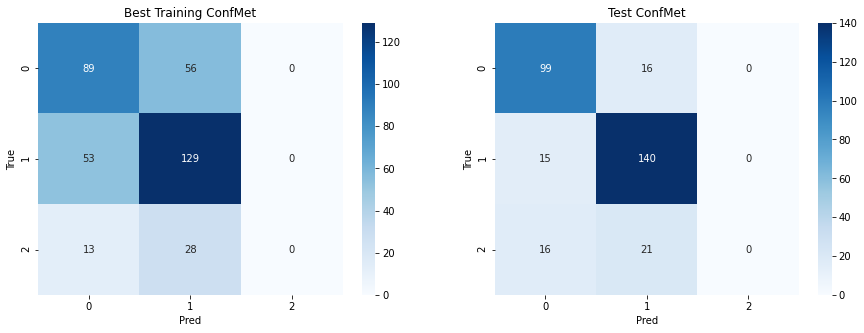

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:17<00:00, 10.58s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.077780,1.053101,0.395105,0.467391
1,0.971004,1.004251,0.594406,0.508152
2,0.887574,1.003270,0.710956,0.508152
3,0.816290,1.001998,0.769231,0.508152
4,0.815710,1.129614,0.740093,0.413043
5,0.893865,1.090786,0.650350,0.442935
6,0.872743,0.995154,0.663170,0.546196
7,0.850777,1.158848,0.692308,0.391304
8,0.826751,1.053308,0.719114,0.494565
9,0.798449,0.997128,0.747086,0.548913



Training complete in 5m 18s
Best val Acc: 0.600543


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6005434782608695


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.18it/s]



Test Accuracy : 0.7948 

Test Loss : 0.7646 



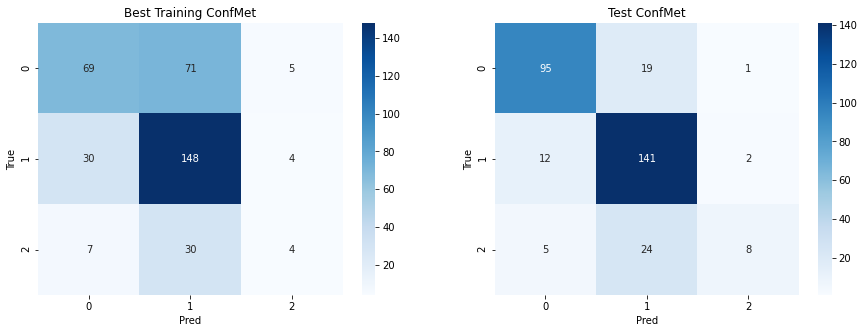

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.067213,1.041086,0.440559,0.494565
1,0.964318,1.001079,0.588578,0.519022
2,0.879771,0.996804,0.720280,0.516304
3,0.800665,1.029097,0.785548,0.505435
4,0.796940,1.020683,0.754079,0.516304
5,0.873980,1.063688,0.664336,0.459239
6,0.881393,0.973810,0.652681,0.562500
7,0.863722,1.032959,0.681818,0.508152
8,0.844261,1.062524,0.705128,0.486413
9,0.786231,1.006458,0.761072,0.540761



Training complete in 5m 15s
Best val Acc: 0.592391


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.592391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.08it/s]



Test Accuracy : 0.8306 

Test Loss : 0.7162 



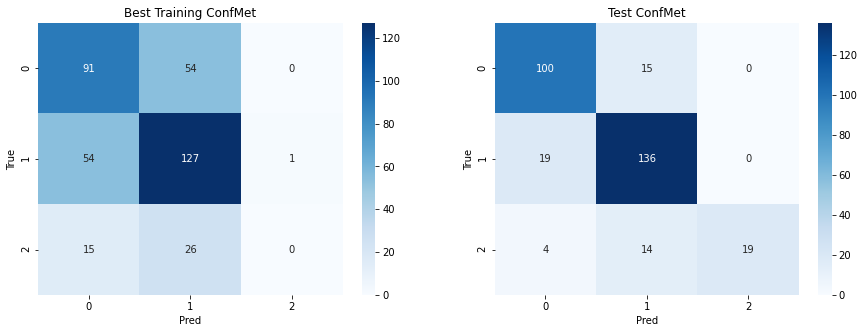

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.53s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.072005,1.030732,0.424242,0.500000
1,0.964841,1.002231,0.587413,0.510870
2,0.880135,0.989954,0.707459,0.538043
3,0.810040,1.092014,0.776224,0.432065
4,0.803709,0.989964,0.752914,0.540761
5,0.866543,1.086992,0.685315,0.442935
6,0.890462,1.056390,0.645688,0.494565
7,0.877768,1.150168,0.667832,0.394022
8,0.846068,0.984481,0.698135,0.551630
9,0.819008,0.987344,0.726107,0.548913



Training complete in 5m 16s
Best val Acc: 0.611413


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6114130434782609


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.69it/s]



Test Accuracy : 0.7329 

Test Loss : 0.8245 



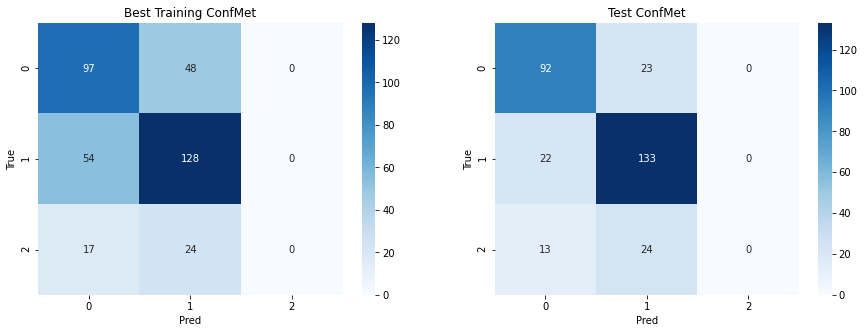

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:16<00:00, 10.56s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.083874,1.052858,0.386946,0.459239
1,0.972829,1.000187,0.588578,0.505435
2,0.895284,0.981695,0.692308,0.567935
3,0.826840,1.001388,0.758741,0.516304
4,0.792161,1.143513,0.772727,0.394022
5,0.847213,1.044970,0.700466,0.505435
6,0.874583,1.034815,0.674825,0.491848
7,0.868399,1.051942,0.671329,0.497283
8,0.820743,1.056933,0.728438,0.494565
9,0.811938,1.066688,0.738928,0.464674



Training complete in 5m 17s
Best val Acc: 0.584239


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5842391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.19it/s]



Test Accuracy : 0.8469 

Test Loss : 0.6993 



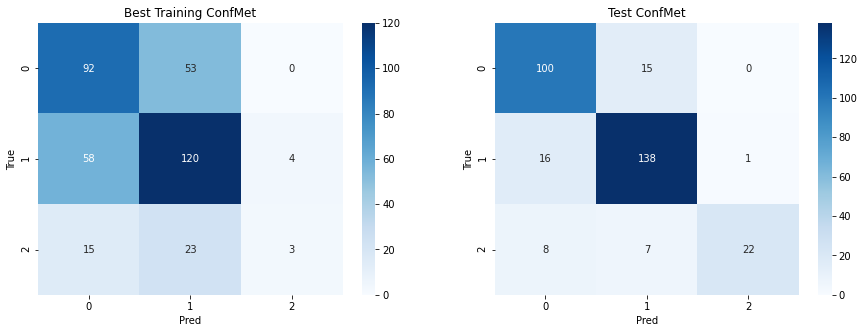

In [76]:
jigsaw_acc, jigsaw_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                test_dataloader,
                                                                                                downstram_cls_len,
                                                                                                pretrained_arch = False,
                                                                                                mode = 'jig_noimagenet',
                                                                                                learner_path = 'jigsaw_trained_model_filtered_nopretrainedpretext.pth')


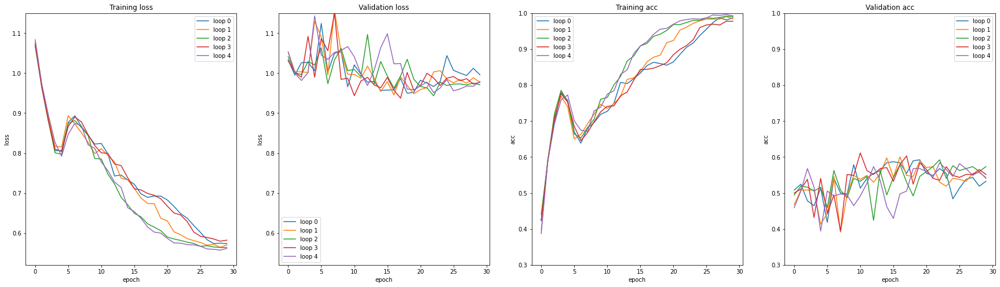

In [77]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [78]:
df_res_jigsaw = pd.DataFrame({'jigsaw_acc_notpretrained_pretext':jigsaw_acc, 'jigsaw_loss_notpretrained_pretext':jigsaw_loss})
df_res_jigsaw.to_csv(path_result/'df_res_jigsaw_notpretrained_pretext.csv')

>> #### Grad-CAM Evaluation

In [79]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  47
positive case :  260


In [80]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw_np",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw_np",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : jigsaw_np (negative): 100%|██████████| 47/47 [01:04<00:00,  1.36s/it]


Grad-CAM : jigsaw_np (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  jig_noimagenet_dwnstrm_model.pth


Grad-CAM : jigsaw_np (positive): 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]


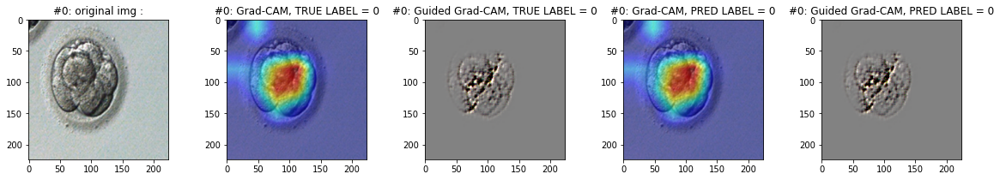

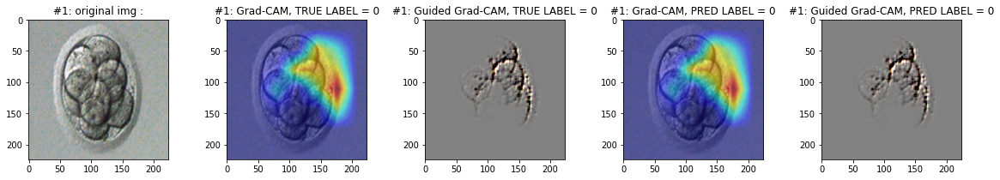

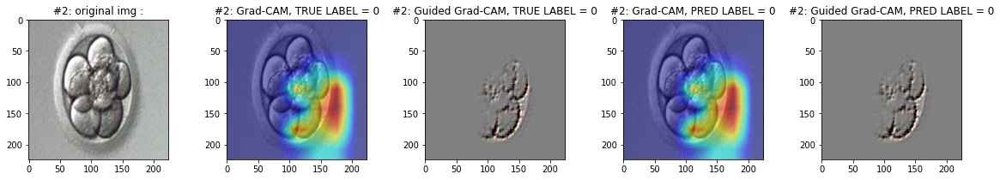

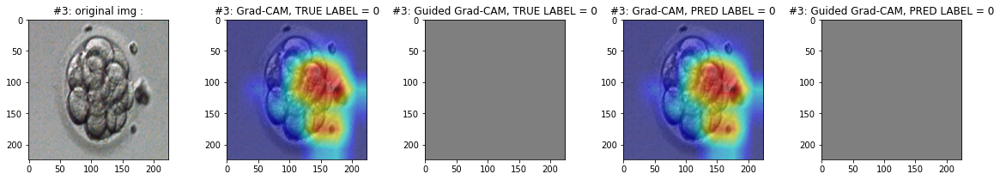

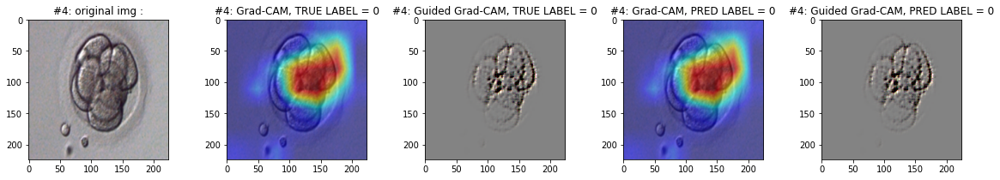

In [81]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw_np",
                 case = "positive")

In [82]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "jigsaw_np",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

## **Downstream task No Pretext**

> ### Model __with__ Pretrained ImageNet

>> #### Training the model

>>>> loop 0 : 


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.47s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.030482,0.990625,0.495338,0.622283
1,0.896731,0.927448,0.687646,0.616848
2,0.792879,0.905356,0.783217,0.638587
3,0.695762,0.919412,0.862471,0.619565
4,0.651438,0.940009,0.918415,0.597826
5,0.636745,0.877576,0.931235,0.660326
6,0.657867,1.093896,0.907925,0.407609
7,0.698927,0.903926,0.854312,0.616848
8,0.677122,0.936359,0.874126,0.603261
9,0.640544,0.894183,0.914918,0.644022



Training complete in 5m 14s
Best val Acc: 0.711957


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7119565217391305


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.21it/s]



Test Accuracy : 0.9218 

Test Loss : 0.6346 



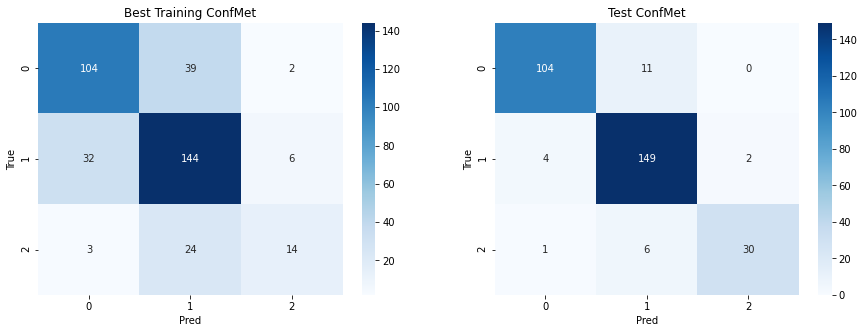

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:15<00:00, 10.51s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.040183,0.997972,0.497669,0.573370
1,0.902904,0.922536,0.675991,0.619565
2,0.776653,0.910672,0.810023,0.644022
3,0.675803,0.889684,0.906760,0.665761
4,0.626542,0.978233,0.948718,0.570652
5,0.622924,0.930649,0.939394,0.592391
6,0.659885,0.963231,0.897436,0.554348
7,0.719276,0.928774,0.828671,0.614130
8,0.683482,0.936501,0.863636,0.589674
9,0.655260,0.855285,0.898601,0.690217



Training complete in 5m 15s
Best val Acc: 0.709239


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7092391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.02it/s]



Test Accuracy : 0.9251 

Test Loss : 0.6324 



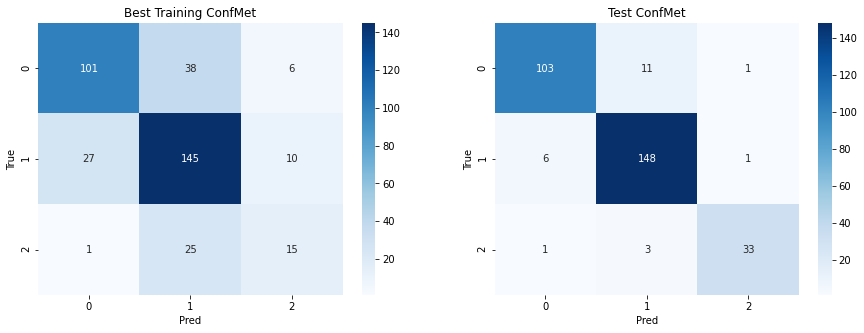

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.46s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.073080,0.998737,0.421911,0.608696
1,0.909461,0.911165,0.666667,0.638587
2,0.779213,0.882730,0.794872,0.668478
3,0.673012,0.878896,0.907925,0.673913
4,0.615053,0.874389,0.959207,0.657609
5,0.615632,0.940842,0.948718,0.605978
6,0.645414,0.990297,0.911422,0.540761
7,0.664164,0.932785,0.892774,0.608696
8,0.658284,0.875965,0.891608,0.665761
9,0.649373,0.885457,0.906760,0.654891



Training complete in 5m 14s
Best val Acc: 0.703804


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7038043478260869


Testing : 100%|██████████| 20/20 [00:01<00:00, 10.98it/s]



Test Accuracy : 0.9055 

Test Loss : 0.6413 



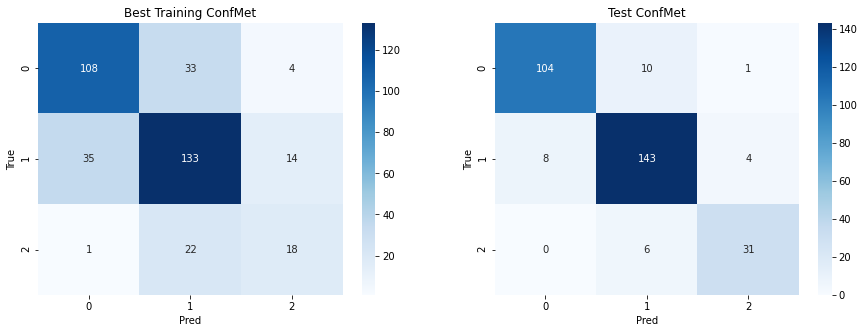

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.45s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.067143,1.013708,0.442890,0.546196
1,0.918890,0.928734,0.664336,0.625000
2,0.797057,0.901194,0.780886,0.649457
3,0.682765,0.920565,0.882284,0.633152
4,0.639703,0.921954,0.927739,0.616848
5,0.644728,0.901895,0.917249,0.619565
6,0.678835,0.895124,0.882284,0.649457
7,0.713443,0.900668,0.829837,0.630435
8,0.668818,0.889970,0.883450,0.646739
9,0.663323,0.863691,0.891608,0.687500



Training complete in 5m 14s
Best val Acc: 0.687500


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.6875


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.15it/s]



Test Accuracy : 0.8534 

Test Loss : 0.6949 



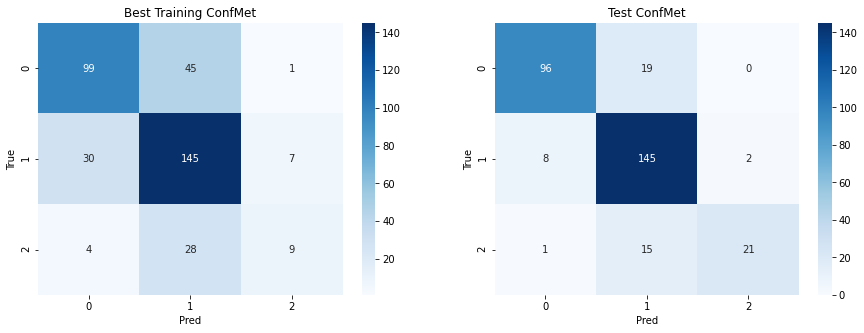

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.44s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.049140,0.990818,0.502331,0.611413
1,0.912332,0.915581,0.678322,0.641304
2,0.780209,0.894420,0.801865,0.652174
3,0.663261,0.893914,0.914918,0.638587
4,0.619526,0.881802,0.948718,0.668478
5,0.643681,0.995043,0.923077,0.521739
6,0.661964,1.059243,0.898601,0.453804
7,0.697639,0.919139,0.851981,0.622283
8,0.689480,0.855225,0.861305,0.692935
9,0.645173,0.926860,0.906760,0.619565



Training complete in 5m 13s
Best val Acc: 0.709239


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.7092391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.24it/s]



Test Accuracy : 0.9055 

Test Loss : 0.6425 



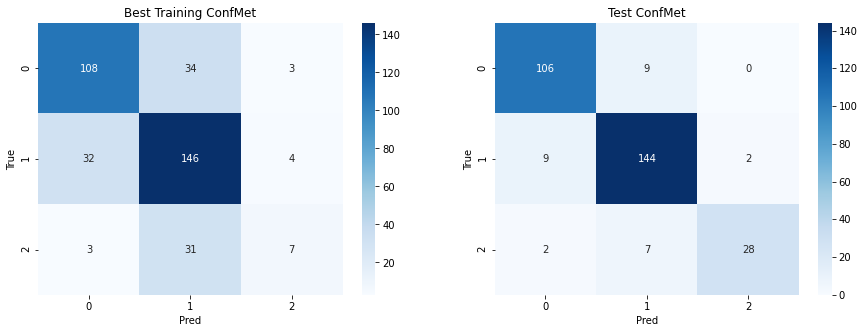

In [83]:
no_pretext_acc, no_pretext_loss, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                        test_dataloader,
                                                                                                        downstram_cls_len,
                                                                                                        pretrained_arch = True,
                                                                                                        mode = 'nopretext',
                                                                                                        learner_path = None)


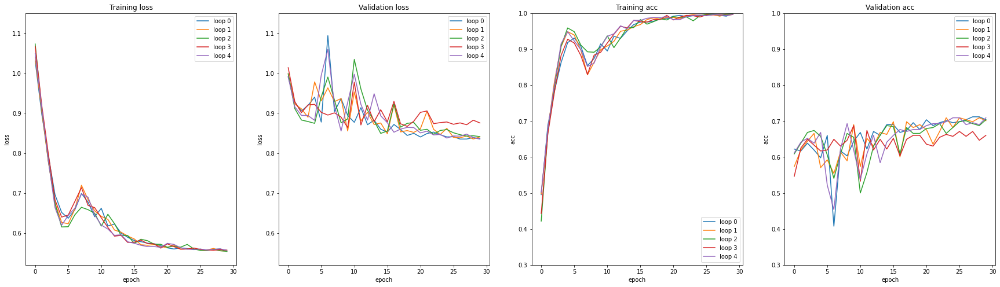

In [84]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [85]:
df_res_no_pretext = pd.DataFrame({'no_pretext_acc':no_pretext_acc, 'no_pretext_loss':no_pretext_loss})
df_res_no_pretext.to_csv(path_result/'df_res_no_pretext.csv')

>> #### Grad-CAM Evaluation

In [86]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  23
positive case :  284


In [87]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : benchmark (negative): 100%|██████████| 23/23 [00:31<00:00,  1.36s/it]


Grad-CAM : benchmark (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  nopretext_dwnstrm_model.pth


Grad-CAM : benchmark (positive): 100%|██████████| 5/5 [00:07<00:00,  1.59s/it]


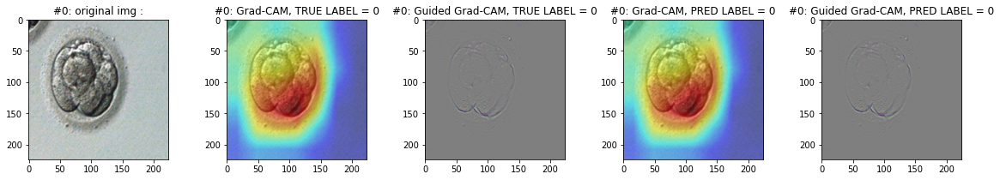

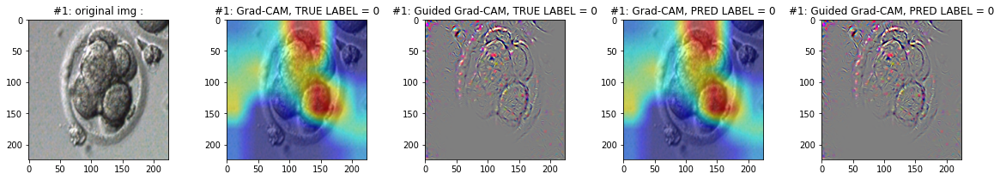

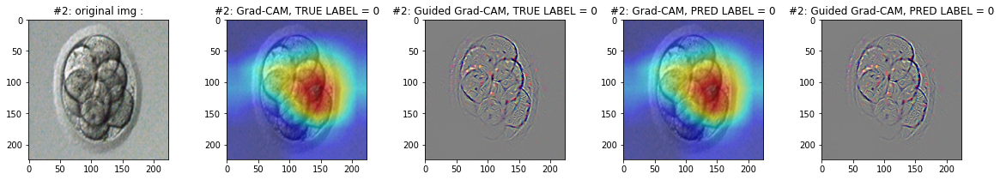

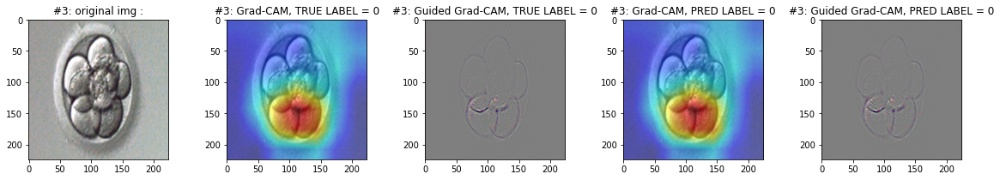

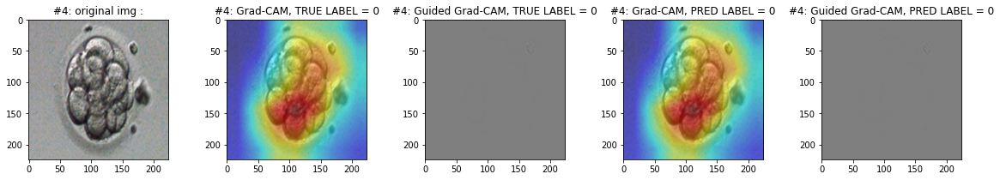

In [88]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark",
                 case = "positive")

In [89]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

> ### Model __without__ Pretrained ImageNet

>> #### Training the model

>>>> loop 0 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.061942,1.045432,0.449883,0.494565
1,1.029243,1.033812,0.491841,0.494565
2,1.018918,1.017725,0.509324,0.494565
3,1.013378,1.008913,0.510490,0.494565
4,1.013115,1.014379,0.512821,0.494565
5,1.009914,1.139475,0.503497,0.388587
6,1.005005,1.138377,0.519814,0.394022
7,0.972771,0.985447,0.568765,0.535326
8,0.976410,1.004273,0.567599,0.505435
9,0.942518,0.992946,0.599068,0.554348



Training complete in 5m 15s
Best val Acc: 0.584239


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5842391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.27it/s]



Test Accuracy : 0.6352 

Test Loss : 0.9081 



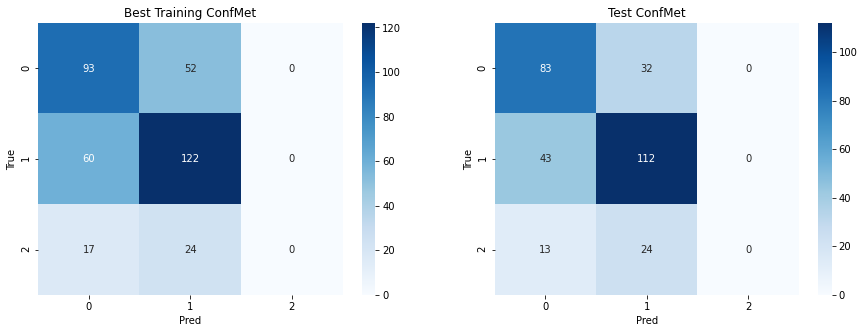

>>>> loop 1 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.48s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.083040,1.046585,0.393939,0.480978
1,1.027615,1.024755,0.505828,0.494565
2,1.015314,1.032061,0.511655,0.494565
3,1.020530,1.018289,0.498834,0.494565
4,1.010610,1.022419,0.508159,0.494565
5,1.012093,1.035119,0.497669,0.494565
6,1.010427,1.011991,0.512821,0.486413
7,1.004191,1.045522,0.508159,0.494565
8,0.990361,0.993389,0.540793,0.516304
9,0.996648,1.051464,0.526807,0.494565



Training complete in 5m 14s
Best val Acc: 0.595109


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.595108695652174


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.37it/s]



Test Accuracy : 0.7850 

Test Loss : 0.7624 



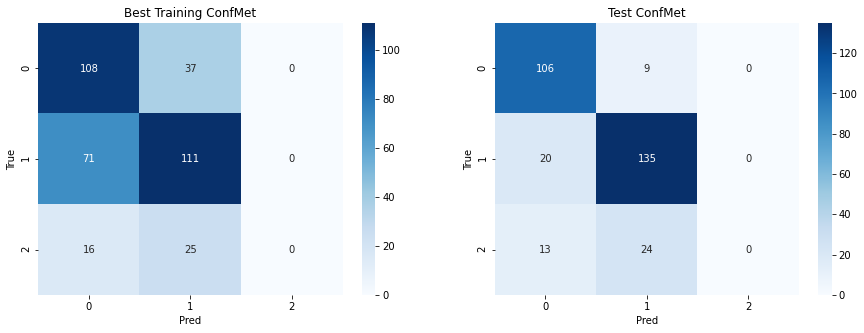

>>>> loop 2 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.46s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.062408,1.051845,0.462704,0.497283
1,1.026032,1.029731,0.509324,0.491848
2,1.021327,1.049151,0.510490,0.494565
3,1.016174,1.043021,0.506993,0.494565
4,1.012948,1.048609,0.498834,0.396739
5,1.004493,1.005920,0.503497,0.500000
6,1.001178,1.038479,0.523310,0.470109
7,0.990876,1.004894,0.533800,0.516304
8,0.990796,1.106066,0.534965,0.404891
9,0.965644,1.018234,0.571096,0.508152



Training complete in 5m 14s
Best val Acc: 0.586957


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5869565217391305


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.22it/s]



Test Accuracy : 0.7557 

Test Loss : 0.7914 



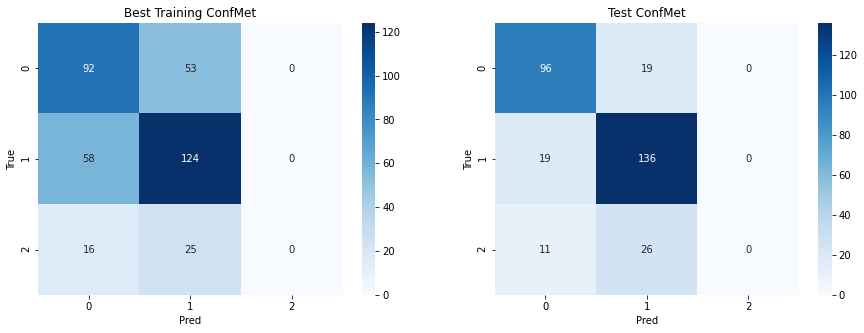

>>>> loop 3 : 


Epoch :: 100%|██████████| 30/30 [05:14<00:00, 10.49s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.105456,1.043905,0.293706,0.483696
1,1.028275,1.019231,0.497669,0.491848
2,1.014498,1.018357,0.509324,0.494565
3,1.014487,1.019059,0.496503,0.494565
4,1.016481,1.011937,0.505828,0.489130
5,1.004791,1.039348,0.505828,0.494565
6,1.006176,1.006416,0.506993,0.516304
7,0.998638,0.986659,0.534965,0.524457
8,0.986261,1.015430,0.536131,0.510870
9,0.956010,1.043725,0.578089,0.470109



Training complete in 5m 15s
Best val Acc: 0.592391


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.592391304347826


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.22it/s]



Test Accuracy : 0.7752 

Test Loss : 0.7688 



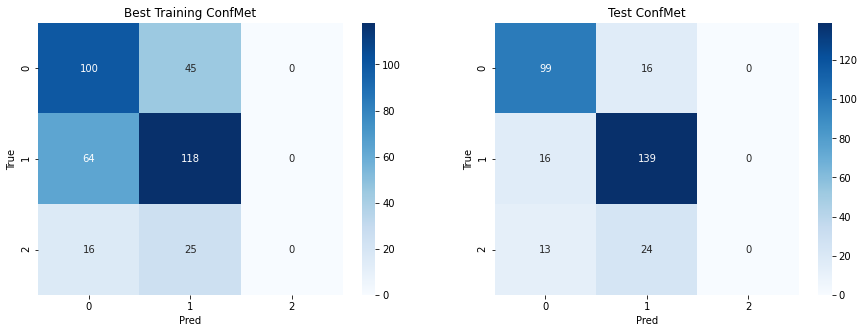

>>>> loop 4 : 


Epoch :: 100%|██████████| 30/30 [05:13<00:00, 10.46s/it]


,train_loss,val_loss,train_acc,val_acc
0,1.084678,1.058883,0.409091,0.459239
1,1.039587,1.023268,0.486014,0.494565
2,1.014212,1.027875,0.509324,0.483696
3,1.013033,1.000849,0.508159,0.494565
4,1.012415,1.043587,0.508159,0.434783
5,1.010316,1.014433,0.505828,0.494565
6,1.014384,1.018042,0.512821,0.494565
7,0.998036,0.992921,0.518648,0.551630
8,0.983620,1.112288,0.553613,0.402174
9,0.957930,1.028294,0.572261,0.500000



Training complete in 5m 14s
Best val Acc: 0.576087


Testing :   0%|          | 0/20 [00:00<?, ?it/s]

best acc using sklearn:  0.5760869565217391


Testing : 100%|██████████| 20/20 [00:01<00:00, 11.20it/s]



Test Accuracy : 0.6515 

Test Loss : 0.8937 



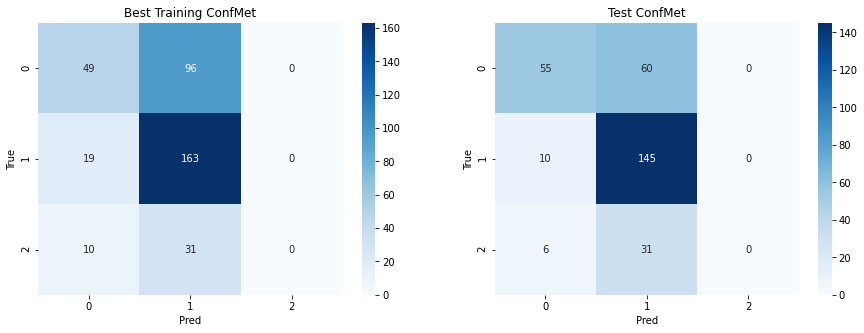

In [90]:
no_pretext_acc_np, no_pretext_loss_np, training_result, input_dict_test, trained_model_path = downstream_task(training_dataloader,
                                                                                                        test_dataloader,
                                                                                                        downstram_cls_len,
                                                                                                        pretrained_arch = False,
                                                                                                        mode = 'nopretext_np',
                                                                                                        learner_path = None)


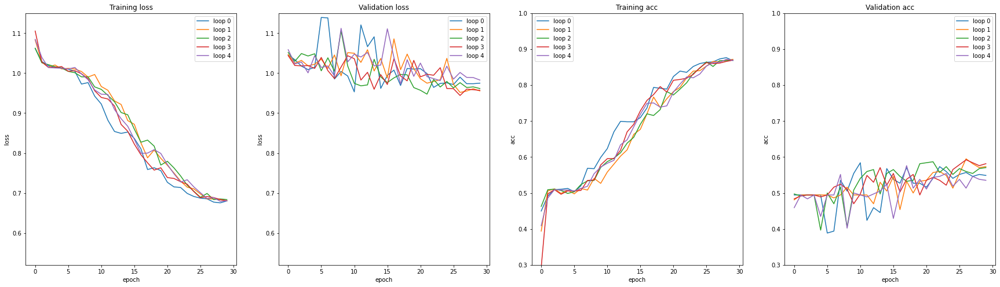

In [91]:
plot_training(training_result, 0.52, 1.15, 0.3, 1)

In [92]:
df_res_no_pretext = pd.DataFrame({'no_pretext_acc_np':no_pretext_acc_np, 'no_pretext_loss_np':no_pretext_loss_np})
df_res_no_pretext.to_csv(path_result/'df_res_no_pretext_np.csv')

>> #### Grad-CAM Evaluation

In [93]:
true_pred_idx = list()
false_pred_idx = list()

for idx in range(len(input_dict_test['true_labels'])):
  if input_dict_test['true_labels'][idx] == input_dict_test['predicted_labels'][idx]:
    true_pred_idx.append(idx)
  else:
    false_pred_idx.append(idx)
print("negative case : ",len(false_pred_idx))
print("positive case : ",len(true_pred_idx))

negative case :  66
positive case :  241


In [94]:
input_image_numpy = get_input_test_phase(input_dict_test)

## CORRECT predicted images
correct_input_img = [input_image_numpy[i] for i in true_pred_idx]
correct_input_img_true_label = [input_dict_test['true_labels'][i] for i in true_pred_idx]
correct_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in true_pred_idx]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:],
                     'predicted_labels':correct_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark_np",
                 case = "positive",
                 display_res = False)

correct_input_img = correct_input_img[:5]
correct_input_lbl = {'true_labels':correct_input_img_true_label[:5],
                   'predicted_labels':correct_input_img_pred_label[:5]}

## WRONG predicted images
wrong_input_img = [input_image_numpy[i] for i in false_pred_idx]
wrong_input_img_true_label = [input_dict_test['true_labels'][i] for i in false_pred_idx]
wrong_input_img_pred_label = [input_dict_test['predicted_labels'][i] for i in false_pred_idx]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:],
                   'predicted_labels':wrong_input_img_pred_label[:]}

display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark_np",
                 case = "negative",
                 display_res = False)

wrong_input_img = wrong_input_img[:15]
wrong_input_lbl = {'true_labels':wrong_input_img_true_label[:15],
                   'predicted_labels':wrong_input_img_pred_label[:15]}

Grad-CAM : benchmark_np (negative): 100%|██████████| 66/66 [01:29<00:00,  1.36s/it]


Grad-CAM : benchmark_np (positive):   0%|          | 0/5 [00:00<?, ?it/s]

Trained Model (correct) :  nopretext_np_dwnstrm_model.pth


Grad-CAM : benchmark_np (positive): 100%|██████████| 5/5 [00:07<00:00,  1.58s/it]


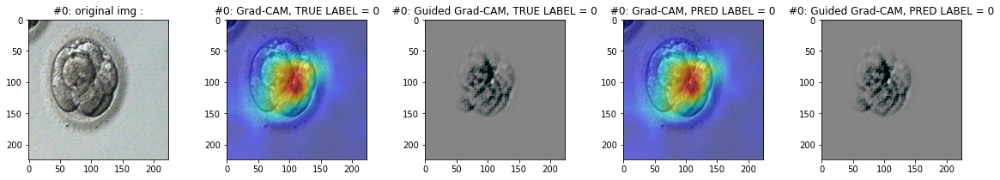

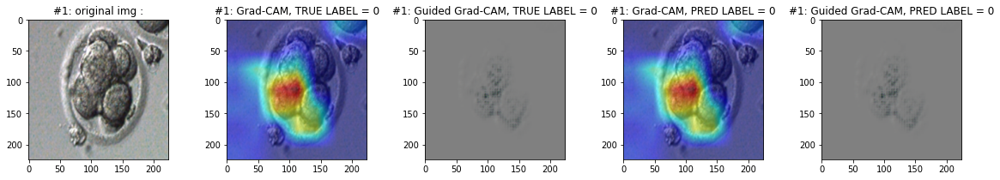

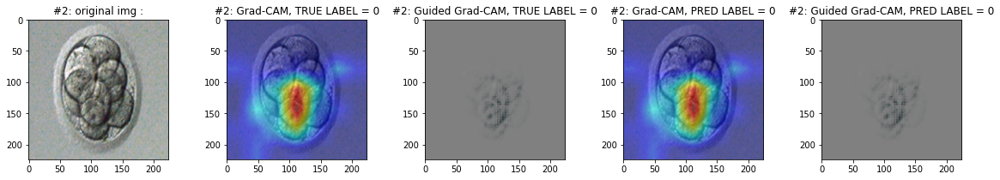

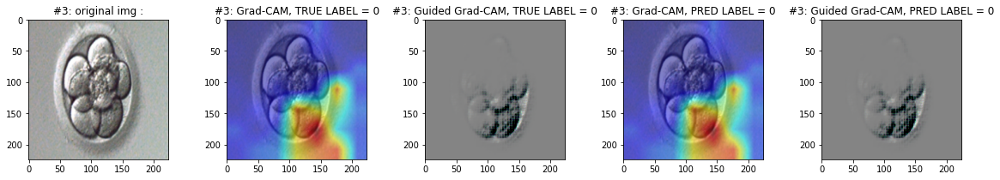

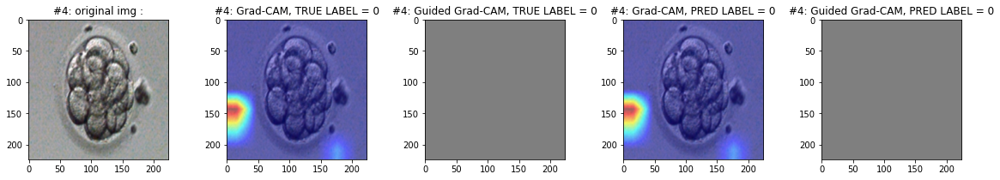

In [95]:
print("Trained Model (correct) : ",trained_model_path)
display_grad_cam(input_image_numpy = correct_input_img, 
                 labels_image_numpy = correct_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark_np",
                 case = "positive")

In [96]:
print("Trained Model (wrong) : ",trained_model_path)
display_grad_cam(input_image_numpy = wrong_input_img, 
                 labels_image_numpy = wrong_input_lbl, 
                 path = str(path_models/str(trained_model_path)), 
                 val_dl = test_dataloader, 
                 cls = downstram_cls_len,
                 model_name = "benchmark_np",
                 case = "negative")

Output hidden; open in https://colab.research.google.com to view.

## **Result Comparison**

In [97]:
## no pretext
df_nopretext = pd.read_csv(path_result/'df_res_no_pretext.csv')
df_nopretext_np = pd.read_csv(path_result/'df_res_no_pretext_np.csv')

## pretext task pretrained model
df_jigsaw = pd.read_csv(path_result/'df_res_jigsaw_pretrained_pretext.csv')
df_rotation = pd.read_csv(path_result/'df_res_rotation_pretrained_pretext.csv')
df_simclrv1 = pd.read_csv(path_result/'df_res_simclr_pretrained_pretext.csv')

## pretext task notpretrained model
df_jigsaw_notpretrained = pd.read_csv(path_result/'df_res_jigsaw_notpretrained_pretext.csv')
df_rotation_notpretrained = pd.read_csv(path_result/'df_res_rotation_notpretrained_pretext.csv')
df_simclrv1_notpretrained = pd.read_csv(path_result/'df_res_simclr_notpretrained_pretext.csv')

In [98]:
result_acc_pd = pd.DataFrame({'loop':['#0','#1','#2','#3','#4'],
                            'rotation_val_acc_notpretrained':df_rotation_notpretrained['rotation_acc_notpretrained_pretext'],
                            'jigsaw_val_acc_notpretrained':df_jigsaw_notpretrained['jigsaw_acc_notpretrained_pretext'],
                            'SimCLRv1_val_acc_notpretrained':df_simclrv1_notpretrained['simclr_acc_notpretrained_pretext'],
                            'rotation_val_acc':df_rotation['rotation_acc'],
                            'jigsaw_val_acc':df_jigsaw['jigsaw_acc'],
                            'SimCLRv1_val_acc':df_simclrv1['simclr_acc'],
                            'no_pretext_val_acc':df_nopretext['no_pretext_acc'],
                            'no_pretext_val_acc_np':df_nopretext_np['no_pretext_acc_np']})

result_loss_pd = pd.DataFrame({'loop':['#0','#1','#2','#3','#4'],
                              'rotation_val_loss_notpretrained':df_rotation_notpretrained['rotation_loss_notpretrained_pretext'],
                              'jigsaw_val_loss_notpretrained':df_jigsaw_notpretrained['jigsaw_loss_notpretrained_pretext'],
                              'SimCLRv1_val_loss_notpretrained':df_simclrv1_notpretrained['simclr_loss_notpretrained_pretext'],
                              'rotation_val_loss':df_rotation['rotation_loss'],
                              'jigsaw_val_loss':df_jigsaw['jigsaw_loss'],
                              'SimCLRv1_val_loss':df_simclrv1['simclr_loss'],
                              'no_pretext_val_loss':df_nopretext['no_pretext_loss'],
                               'no_pretext_val_loss_np':df_nopretext_np['no_pretext_loss_np']
                               })

>### Accuracy

In [99]:
rot_mean_acc_notpretrained = np.mean(df_rotation_notpretrained['rotation_acc_notpretrained_pretext'])
rot_stddev_notpretrained = np.std(df_rotation_notpretrained['rotation_acc_notpretrained_pretext'])

jig_mean_acc_notpretrained = np.mean(df_jigsaw_notpretrained['jigsaw_acc_notpretrained_pretext'])
jig_stddev_notpretrained = np.std(df_jigsaw_notpretrained['jigsaw_acc_notpretrained_pretext'])

simclr_mean_acc_notpretrained = np.mean(df_simclrv1_notpretrained['simclr_acc_notpretrained_pretext'])
simclr_stddev_notpretrained = np.std(df_simclrv1_notpretrained['simclr_acc_notpretrained_pretext'])

rot_mean_acc = np.mean(df_rotation['rotation_acc'])
rot_stddev = np.std(df_rotation['rotation_acc'])

jig_mean_acc = np.mean(df_jigsaw['jigsaw_acc'])
jig_stddev = np.std(df_jigsaw['jigsaw_acc'])

simclr_mean_acc = np.mean(df_simclrv1['simclr_acc'])
simclr_stddev = np.std(df_simclrv1['simclr_acc'])

nopretext_mean_acc = np.mean(df_nopretext['no_pretext_acc'])
nopretext_stddev = np.std(df_nopretext['no_pretext_acc'])

nopretext_mean_acc_np = np.mean(df_nopretext_np['no_pretext_acc_np'])
nopretext_stddev_np = np.std(df_nopretext_np['no_pretext_acc_np'])

last_row = pd.DataFrame([['Average Acc',
                          str(str(round(rot_mean_acc_notpretrained,4))+' \u00B1 '+str(round(rot_stddev_notpretrained,4))),
                          str(str(round(jig_mean_acc_notpretrained,4))+' \u00B1 '+str(round(jig_stddev_notpretrained,4))),
                          str(str(round(simclr_mean_acc_notpretrained,4))+' \u00B1 '+str(round(simclr_stddev_notpretrained,4))),
                          str(str(round(rot_mean_acc,4))+' \u00B1 '+str(round(rot_stddev,4))),
                          str(str(round(jig_mean_acc,4))+' \u00B1 '+str(round(jig_stddev,4))),
                          str(str(round(simclr_mean_acc,4))+' \u00B1 '+str(round(simclr_stddev,4))),
                          str(str(round(nopretext_mean_acc,4))+' \u00B1 '+str(round(nopretext_stddev,4))),
                          str(str(round(nopretext_mean_acc_np,4))+' \u00B1 '+str(round(nopretext_stddev_np,4)))
                        ]],
                        columns=['loop','rotation_val_acc_notpretrained', 'jigsaw_val_acc_notpretrained', 'SimCLRv1_val_acc_notpretrained'
                        ,'rotation_val_acc', 'jigsaw_val_acc', 'SimCLRv1_val_acc', 'no_pretext_val_acc', 'no_pretext_val_acc_np'])



In [100]:
result_acc_pd = result_acc_pd.append(last_row, ignore_index=True)
print("Acc with pretrained pretext ResNet50")
display(result_acc_pd)

Acc with pretrained pretext ResNet50


,loop,rotation_val_acc_notpretrained,jigsaw_val_acc_notpretrained,SimCLRv1_val_acc_notpretrained,rotation_val_acc,jigsaw_val_acc,SimCLRv1_val_acc,no_pretext_val_acc,no_pretext_val_acc_np
0,#0,0.765472,0.778502,0.781759,0.912052,0.918567,0.736156,0.921824,0.635179
1,#1,0.736156,0.794788,0.758958,0.905537,0.899023,0.742671,0.925081,0.785016
2,#2,0.771987,0.830619,0.742671,0.895765,0.912052,0.762215,0.905537,0.7557
3,#3,0.840391,0.732899,0.716612,0.921824,0.892508,0.745928,0.85342,0.775244
4,#4,0.762215,0.846906,0.791531,0.912052,0.921824,0.791531,0.905537,0.651466
5,Average Acc,0.7752 ± 0.0348,0.7967 ± 0.0402,0.7583 ± 0.027,0.9094 ± 0.0086,0.9088 ± 0.0113,0.7557 ± 0.0199,0.9023 ± 0.0257,0.7205 ± 0.0639


[Text(0, 0, 'rotation_val_acc_notpretrained'),
 Text(0, 0, 'jigsaw_val_acc_notpretrained'),
 Text(0, 0, 'SimCLRv1_val_acc_notpretrained'),
 Text(0, 0, 'rotation_val_acc'),
 Text(0, 0, 'jigsaw_val_acc'),
 Text(0, 0, 'SimCLRv1_val_acc'),
 Text(0, 0, 'no_pretext_val_acc'),
 Text(0, 0, 'no_pretext_val_acc_np')]

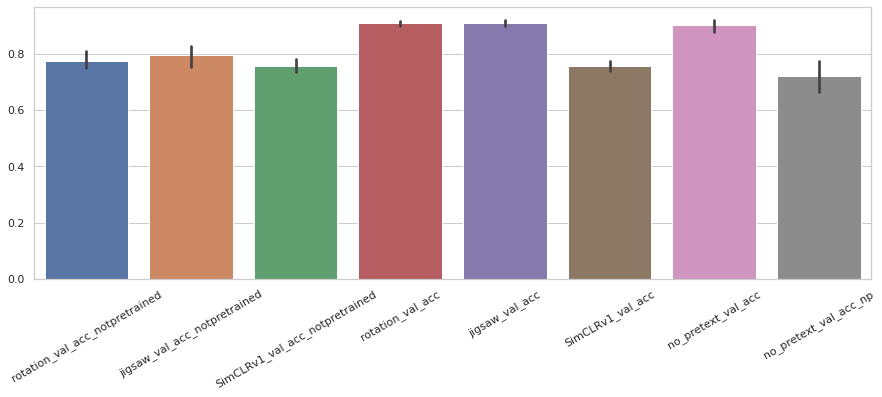

In [101]:
plt.figure(figsize=(15,5))
sns.set_theme(style="whitegrid")
acc_plot = sns.barplot(data = result_acc_pd.iloc[:5,1:])
acc_plot.set_xticklabels(labels=result_acc_pd.columns[1:],
                         rotation=30)

>### Loss

In [102]:
rot_mean_loss_notpretrained = np.mean(df_rotation_notpretrained['rotation_loss_notpretrained_pretext'])
rot_stddev_notpretrained = np.std(df_rotation_notpretrained['rotation_loss_notpretrained_pretext'])

jig_mean_loss_notpretrained = np.mean(df_jigsaw_notpretrained['jigsaw_loss_notpretrained_pretext'])
jig_stddev_notpretrained = np.std(df_jigsaw_notpretrained['jigsaw_loss_notpretrained_pretext'])

simclr_mean_loss_notpretrained = np.mean(df_simclrv1_notpretrained['simclr_loss_notpretrained_pretext'])
simclr_stddev_notpretrained = np.std(df_simclrv1_notpretrained['simclr_loss_notpretrained_pretext'])

rot_mean_loss = np.mean(df_rotation['rotation_loss'])
rot_stddev = np.std(df_rotation['rotation_loss'])

jig_mean_loss = np.mean(df_jigsaw['jigsaw_loss'])
jig_stddev = np.std(df_jigsaw['jigsaw_loss'])

simclr_mean_loss = np.mean(df_simclrv1['simclr_loss'])
simclr_stddev = np.std(df_simclrv1['simclr_loss'])

nopretext_mean_loss = np.mean(df_nopretext['no_pretext_loss'])
nopretext_stddev = np.std(df_nopretext['no_pretext_loss'])

nopretext_mean_loss_np = np.mean(df_nopretext_np['no_pretext_loss_np'])
nopretext_stddev_np = np.std(df_nopretext_np['no_pretext_loss_np'])

last_row = pd.DataFrame([['Average loss',
                          str(str(round(rot_mean_loss_notpretrained,4))+' \u00B1 '+str(round(rot_stddev_notpretrained,4))),
                          str(str(round(jig_mean_loss_notpretrained,4))+' \u00B1 '+str(round(jig_stddev_notpretrained,4))),
                          str(str(round(simclr_mean_loss_notpretrained,4))+' \u00B1 '+str(round(simclr_stddev_notpretrained,4))),
                          str(str(round(rot_mean_loss,4))+' \u00B1 '+str(round(rot_stddev,4))),
                          str(str(round(jig_mean_loss,4))+' \u00B1 '+str(round(jig_stddev,4))),
                          str(str(round(simclr_mean_loss,4))+' \u00B1 '+str(round(simclr_stddev,4))),
                          str(str(round(nopretext_mean_loss,4))+' \u00B1 '+str(round(nopretext_stddev,4))),
                          str(str(round(nopretext_mean_loss_np,4))+' \u00B1 '+str(round(nopretext_stddev_np,4)))
                        ]],
                        columns=['loop','rotation_val_loss_notpretrained', 'jigsaw_val_loss_notpretrained', 'SimCLRv1_val_loss_notpretrained'
                        ,'rotation_val_loss', 'jigsaw_val_loss', 'SimCLRv1_val_loss', 'no_pretext_val_loss', 'no_pretext_val_loss_np'])



In [103]:
result_loss_pd = result_loss_pd.append(last_row, ignore_index=True)
print("Acc with pretrained pretext ResNet50")
display(result_loss_pd)

Acc with pretrained pretext ResNet50


,loop,rotation_val_loss_notpretrained,jigsaw_val_loss_notpretrained,SimCLRv1_val_loss_notpretrained,rotation_val_loss,jigsaw_val_loss,SimCLRv1_val_loss,no_pretext_val_loss,no_pretext_val_loss_np
0,#0,0.782417,0.768218,0.771709,0.64074,0.635546,0.810323,0.6346,0.908111
1,#1,0.821527,0.764559,0.782088,0.642902,0.655027,0.794461,0.632377,0.762434
2,#2,0.7749,0.716152,0.800073,0.653487,0.638152,0.794834,0.641331,0.791403
3,#3,0.697471,0.824461,0.82352,0.627276,0.649245,0.805162,0.694866,0.768758
4,#4,0.772317,0.699327,0.764969,0.643505,0.62932,0.762894,0.64251,0.893746
5,Average loss,0.7697 ± 0.0402,0.7545 ± 0.044,0.7885 ± 0.0212,0.6416 ± 0.0084,0.6415 ± 0.0094,0.7935 ± 0.0165,0.6491 ± 0.0232,0.8249 ± 0.063


[Text(0, 0, 'rotation_val_loss_notpretrained'),
 Text(0, 0, 'jigsaw_val_loss_notpretrained'),
 Text(0, 0, 'SimCLRv1_val_loss_notpretrained'),
 Text(0, 0, 'rotation_val_loss'),
 Text(0, 0, 'jigsaw_val_loss'),
 Text(0, 0, 'SimCLRv1_val_loss'),
 Text(0, 0, 'no_pretext_val_loss'),
 Text(0, 0, 'no_pretext_val_loss_np')]

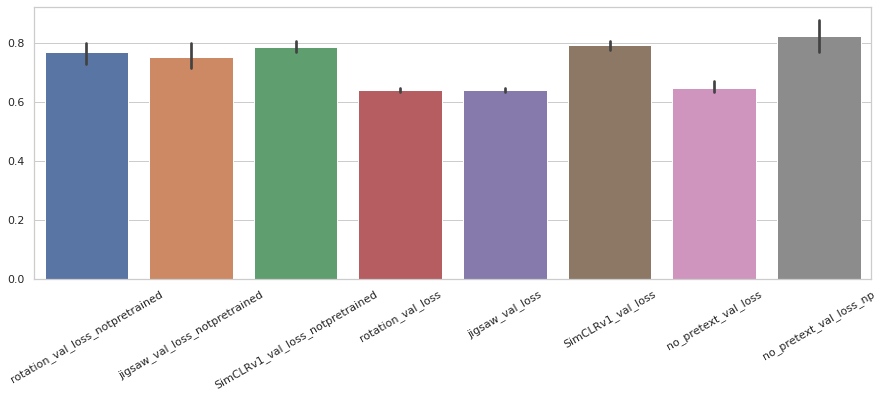

In [104]:
plt.figure(figsize=(15,5))
sns.set_theme(style="whitegrid")
loss_plot = sns.barplot(data = result_loss_pd.iloc[:5,1:])
loss_plot.set_xticklabels(labels=result_loss_pd.columns[1:],
                         rotation=30)